# cdp run_30min_ext

In [1]:
# Env: sc2_v0
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import calendar
import os

In [2]:
site = 'cdp'
site_longname = 'Col de Porte, France'
y_start = 1994
y_end = 2014

labels = ['Ref_30min_ext', 'EZERO_30min_ext']

root_path = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowMIP/'+site+'/'
paths = [root_path+'run_'+label for label in labels]

ds_yr_list = [xr.open_mfdataset(path+'/*_annually.nc').squeeze().load() for path in paths]
ds_mo_list = [xr.open_mfdataset(path+'/*_monthly.nc').squeeze().load() for path in paths]
ds_d_list = [xr.open_mfdataset(path+'/*_daily.nc').squeeze().load() for path in paths]
ds_hh_list = [xr.open_mfdataset(path+'/*_halfhourly.nc').squeeze().load() for path in paths]

In [3]:
path = "/home/lalandmi/eccc/classic-develop/inputFiles/SnowMIP/"+site
rsfile = xr.open_dataset(path+'/rsfile_spinup-final_'+labels[0]+'.nc')

In [4]:
def assign_center_depth(ds, rsfile):
    layer_c = []
    for i in range(len(rsfile.DELZ)):
        if i == 0:
            layer_c.append(rsfile.DELZ.cumsum().values[i]/2)
        else:
            layer_c.append(rsfile.DELZ.cumsum().values[i-1] + rsfile.DELZ.values[i]/2)
    with xr.set_options(keep_attrs=True):
        ds = ds.assign_coords(layer=ds.layer*0+layer_c)
    return ds

In [5]:
for i in range(len(labels)):
    ds_yr_list[i] = assign_center_depth(ds_yr_list[i], rsfile)
    ds_mo_list[i] = assign_center_depth(ds_mo_list[i], rsfile)
    ds_d_list[i] = assign_center_depth(ds_d_list[i], rsfile)
    ds_hh_list[i] = assign_center_depth(ds_hh_list[i], rsfile)

In [6]:
# Paul's SnowMIP data

path_paul = '/home/lalandmi/Dropbox/data/SnowMIP/Paul/CLASS_Results'
label_paul = "SnowMIP"

df_paul = pd.read_csv(path_paul+'/CLASS_sv_REF_'+site+'_'+str(y_start)+'_'+str(y_end)+'.txt', delim_whitespace=True)
df_paul.index = pd.to_datetime(df_paul[['year', 'month', 'day', 'hour']]).values
df_paul= df_paul.drop(columns=['year', 'month', 'day', 'hour'])
df_paul.albsn = df_paul.albsn.replace({0 : np.nan})
df_paul.albs = df_paul.albs.replace({0 : np.nan})
df_paul.tsn = df_paul.tsn.replace({-999 : np.nan})
df_paul.tsns = df_paul.tsns.replace({-999 : np.nan})
ds_paul_h = df_paul.to_xarray()
ds_paul_h = ds_paul_h.rename({'index': 'time'})
ds_paul_h.load()

ds_paul_d = ds_paul_h.resample(time='D').mean().load()
ds_paul_d = ds_paul_d.assign_coords(layer=[0.05 , 0.225, 2.225]) # center of Paul's soil layers (DELZ = [0.1, 0.25, 3.75])

In [7]:
# Combine the soil temperature in one variable
ds_paul_d = ds_paul_d.assign(
    tsl=(('layer', 'time'), [
        list(ds_paul_d['tsl:1'].values),
        list(ds_paul_d['tsl:2'].values),
        list(ds_paul_d['tsl:3'].values),
    ])
)

Text(0.5, 0.98, 'Col de Porte, France')

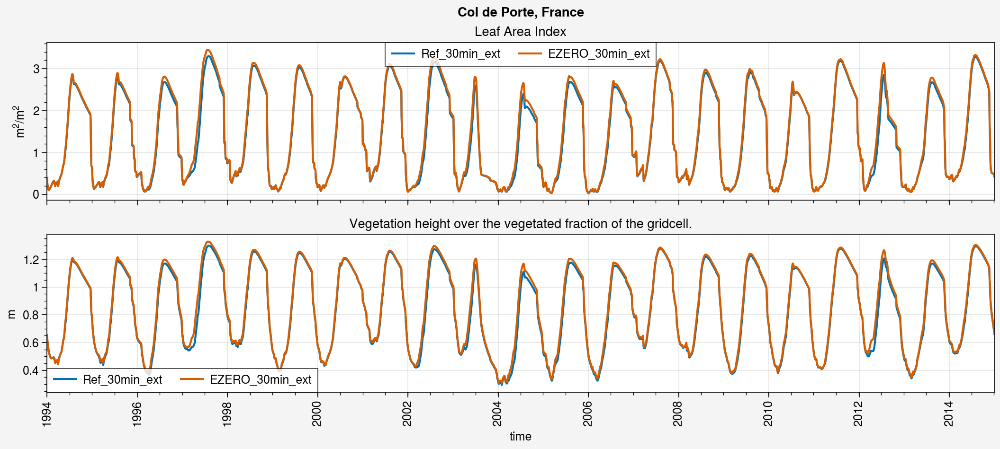

In [8]:
fig, axs = pplt.subplots(ncols=1, nrows=2, refaspect=6, refwidth=10, sharey=0)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.lai, label=label)
    axs[1].plot(ds_d.vegHeight, label=label)

axs[0].format(ylabel=ds_d_list[0].lai.units, title=ds_d_list[0].lai.long_name)
axs[1].format(ylabel=ds_d_list[0].vegHeight.units, title=ds_d_list[0].vegHeight.long_name)

for ax in axs:
    ax.legend()

fig.suptitle(site_longname)

Text(0.5, 0.98, 'Col de Porte, France (1994-2014)')

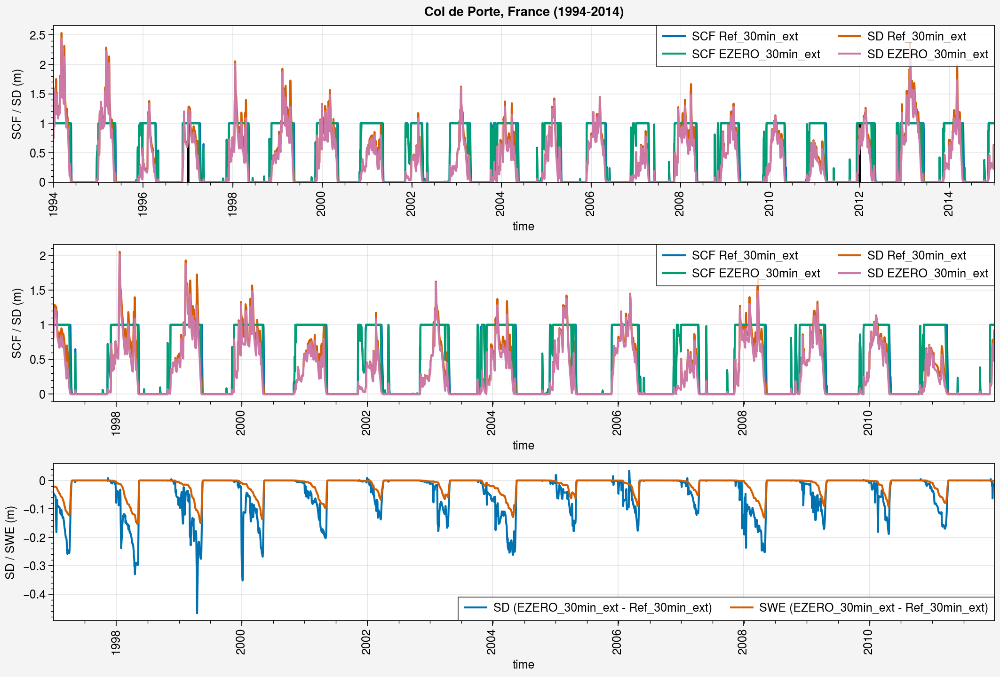

In [9]:
if len(labels) > 1:
    nrows = 3
else: 
    nrows = 2
    
fig, axs = pplt.subplots(ncols=1, nrows=nrows, refaspect=6, refwidth=10, share=0)

##################
### All period ###
##################
start = str(y_start)
end = str(y_end)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[0].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].legend(ncols=2, loc='ur')
axs[0].format(
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = str(y_start+3)
end = str(y_end-3)

for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[1].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[0], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)
axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[-1], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)

axs[1].legend(ncols=2, loc='ur')
axs[1].format(
    ylabel='SCF / SD (m)'
)

if nrows == 3:
    #####################
    ### SWE / SD diff ###
    #####################
    axs[2].plot((ds_d_list[1]-ds_d_list[0]).snd.sel(time=slice(start,end)), label='SD ('+labels[1]+' - '+labels[0]+')')
    axs[2].plot(((ds_d_list[1]-ds_d_list[0]).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+labels[1]+' - '+labels[0]+')')
    
    axs[2].legend(ncols=2)
    axs[2].format(
        ylabel='SD / SWE (m)'
    )

fig.suptitle(site_longname+' ('+str(y_start)+'-'+str(y_end)+')')


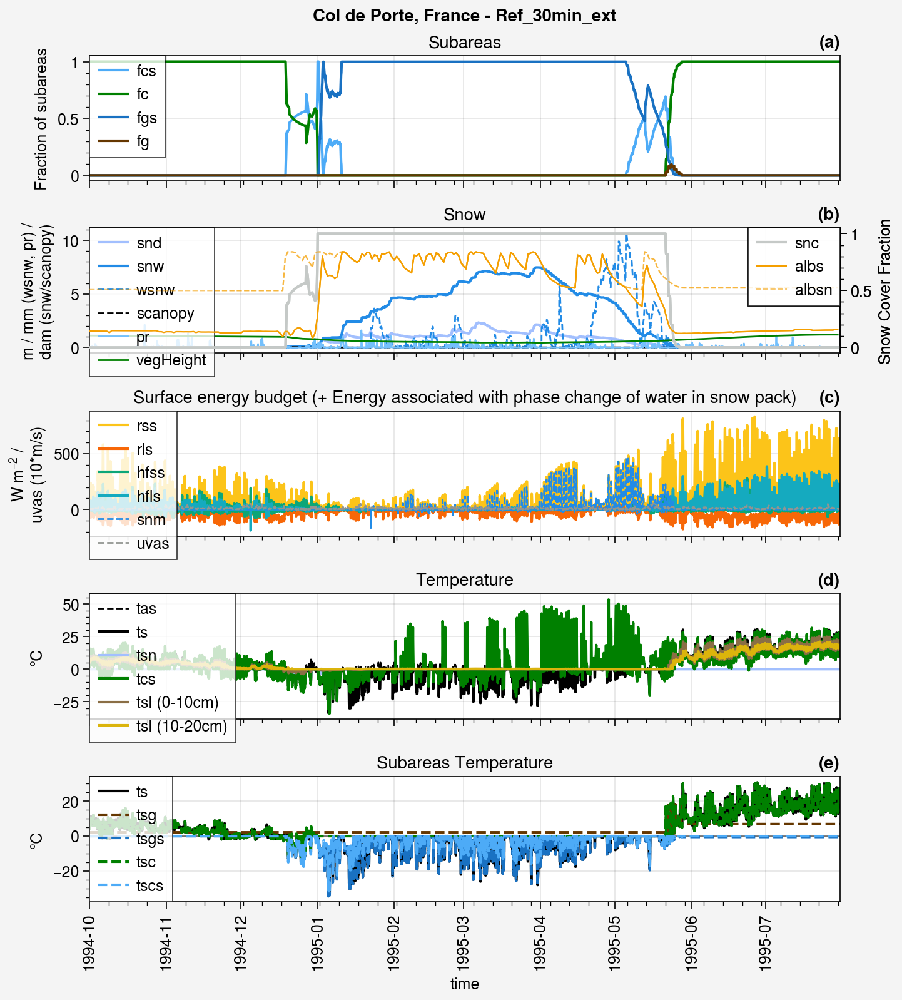

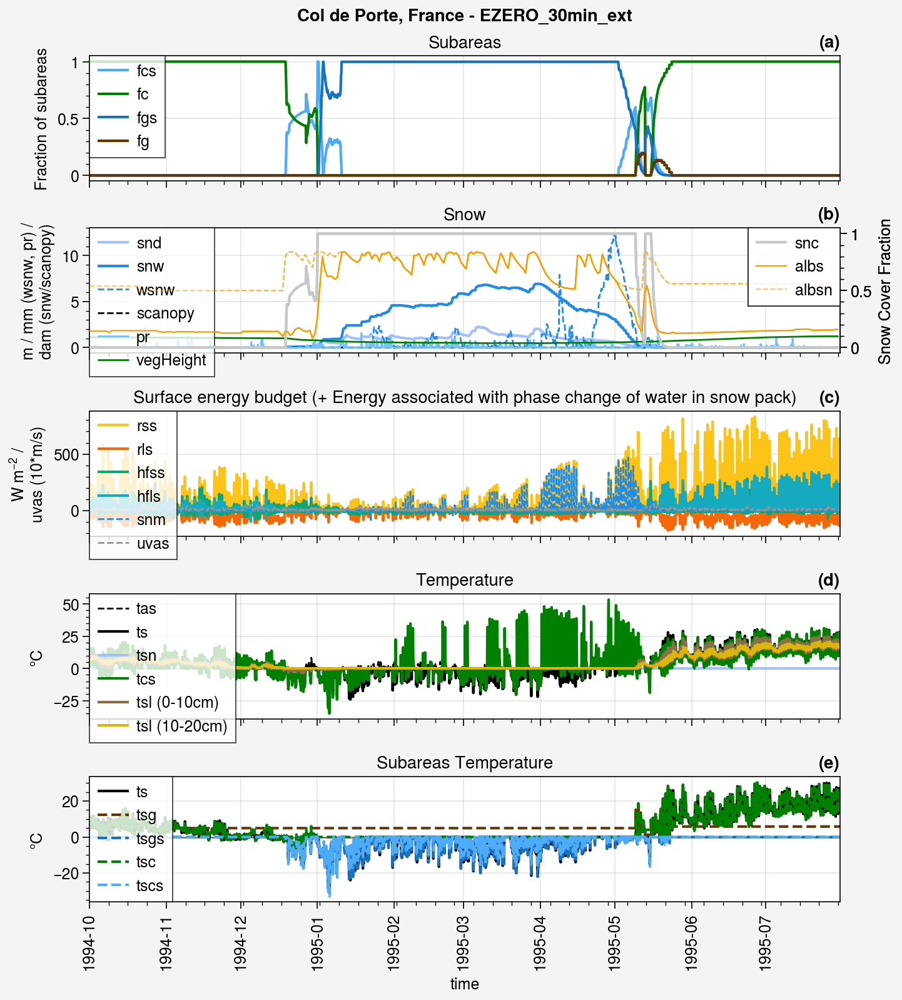

In [13]:
for period in [
    slice(str(y_start)+'-10-01',str(y_start+1)+'-07-30'),
]:

    collabels = labels
    for i, (ds, ds_d) in enumerate(zip(ds_hh_list, ds_d_list)):
        
        fig, axs = pplt.subplots(ncols=1, nrows=5, refaspect=6, refwidth=6, sharey=0)
    
        #############################
        ### Fractions of subareas ###
        #############################

        variables = {
            'fcs': {'color': 'blue4', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fc': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fgs': {'color': 'blue8', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fg': {'color': 'brown', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[0]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='Fraction of subareas', title='Subareas', ylim=(-0.05,1.05))

        ##############################
        ### Snow related variables ###
        ##############################

        variables = {
            'snd': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snw': {'color': 'blue6', 'ls': '-', 'lw': 1.5, 'factor': 1e-3*10, 'shift': 0},
            'wsnw': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'scanopy': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1e-3*10, 'shift': 0},
            'pr': {'color': 'blue3', 'ls': '-', 'lw': 1, 'factor': 500, 'shift': 0},
        #     'albs': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
    #         'mrron': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        #     'snm': {'color': 'blue8', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
        }

        ax = axs[1]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot(ds_d.vegHeight.sel(time=period), label=ds_d.vegHeight.name, color='green', ls='-', lw=1)
        # ax.plot(ds_d.lai.sel(time=period), label='LAI', color='green', ls='-', lw=1)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='m / mm (wsnw, pr) /\ndam (snw/scanopy)', title='Snow')

        variables = {
            'snc': {'color': 'silver', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }
        ox = ax.alty(label='Snow Cover Fraction')
        for key in variables.keys():
            ox.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ox.plot(ds_d.albs.sel(time=period), label='albs', color='yellow7', ls='-', lw=0.8)
        ox.plot(ds_d.albsn.sel(time=period), label='albsn', color='yellow7', ls='--', lw=0.8, alpha=0.5)
        ox.legend(ncols=1, loc='ur')
        ox.format(ylim=(-0.05,1.05))


        ##############################
        ### Surface energy budget ###
        ##############################

        variables = {
            'rss': {'color': 'yellow5', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'rls': {'color': 'orange7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        #     'rlds': {'color': 'orange7', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'hfss': {'color': 'teal7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'hfls': {'color': 'cyan6', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snm': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'uvas': {'color': 'gray', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        }

        ax = axs[2]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='W m$^{-2}$ /\nuvas (10*m/s)', title='Surface energy budget (+ Energy associated with phase change of water in snow pack)')


        ###################
        ### Temperature ###
        ###################

        variables = {
            'tas': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 273.15},
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},    
            'tsn': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'tcs': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[3]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot((ds.tsl-273.15).sel(time=period).isel(layer=0), label=ds.tsl.name+' (0-10cm)', color='dirt')
        ax.plot((ds.tsl-273.15).sel(time=period).isel(layer=1), label=ds.tsl.name+' (10-20cm)', color='gold')
        # ax.plot(ds_h_eval_menard2019.ts.sel(time=period), color='red', label='ts obs')
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Temperature')

        


        ############################
        ### Subareas Temperature ###
        ############################

        variables = {
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},

            'tsg': {'color': 'brown', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsgs': {'color': 'blue8', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsc': {'color': 'green', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tscs': {'color': 'blue4', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
        }

        ax = axs[4]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Subareas Temperature')

        fig.suptitle(site_longname+' - '+collabels[i])
        fig.format(abc='(a)', abcloc='r')
        # fig.save('img/'+labels[i]+'_hh.jpg')

## Compare with obs

In [10]:
path_menard2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'

ds_h_eval_menard2019 = xr.open_dataset(path_menard2019+'/obs_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()
ds_d_eval_menard2019 = ds_h_eval_menard2019.resample(time='D').mean().load()
ds_h_eval_menard2019

<xarray.Dataset> Size: 8MB
Dimensions:   (time: 175320, sdepth: 3)
Coordinates:
  * time      (time) datetime64[ns] 1MB 1994-10-01T01:00:00 ... 2014-10-01
  * sdepth    (sdepth) float32 12B 0.1 0.2 0.5
Data variables:
    albs      (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    snd_auto  (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    snd_man   (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    snw_auto  (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    snw_man   (time) float32 701kB nan nan nan nan nan ... nan nan nan nan nan
    ts        (time) float32 701kB 11.12 9.668 8.029 ... 7.532 7.532 8.029
    tsl       (time, sdepth) float32 2MB 11.95 12.28 12.23 ... 12.95 12.83 12.8

## All

Text(0.5, 0.98, 'Col de Porte, France')

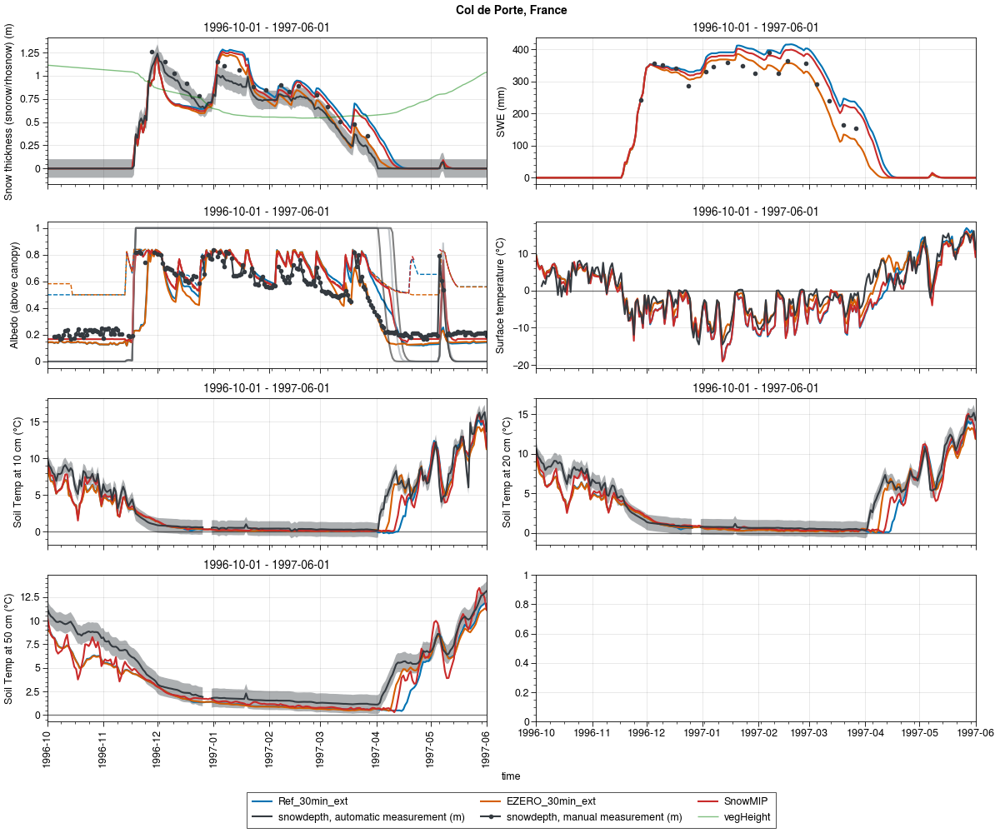

In [11]:
%matplotlib widget
color_obs = 'gray8'
period=slice('1996-10-01', '1997-06-01')

fig, axs = pplt.subplots(nrows=4, ncols=2, refaspect=3.5, sharey=0, figsize=(12,10))

##################
### Snow Depth ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snd.sel(time=period), label=label)

# SnowMIP
axs[0].plot(ds_paul_d.snd.sel(time=period), label=label_paul, color='red9')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
axs[0].plot(ds_d_eval_menard2019.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[0].plot(ds_d_eval_menard2019.snd_man.sel(time=period), marker='.', color=color_obs)

# Veg
axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)

fig.legend(loc='b', ncols=3)
axs[0].format(title=period.start+' - '+period.stop)

##################
### SWE ###
##################
 # Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snw.sel(time=period), label=label)

# SnowMIP
axs[1].plot(ds_paul_d.snw.sel(time=period), label=label_paul, color='red9')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
axs[1].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[1].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.', color=color_obs)

# axs[1].legend(loc='ul', ncols=2)
axs[1].format(title=period.start+' - '+period.stop, ylabel='SWE (mm)')

##################
### Albedo ###
##################
# Simus
k = 0
for ds_d, label in zip(ds_d_list, labels):
    axs[2].plot(ds_d.albs.sel(time=period), label=label+' (albs)', color='C'+str(k))
    axs[2].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', color='C'+str(k), ls='--', lw=1)
    axs[2].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)
    
    k+=1

# SnowMIP
axs[2].plot(ds_paul_d.albs.sel(time=period), label=label_paul+' (albs)', color='red9')
axs[2].plot(ds_paul_d.albsn.sel(time=period), label=label_paul+' (albsn)', color='red9', ls='--', lw=1)
axs[2].plot(ds_paul_d.snc.sel(time=period), label=label_paul+' (SCF)', color='gray6', alpha=0.5)

# Obs
axs[2].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color=color_obs)

# axs[2].legend(loc='ul', ncols=2)
axs[2].format(title=period.start+' - '+period.stop, ylabel='Albedo (above canopy)')


##################
### TS ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[3].plot(ds_d.ts.sel(time=period)-273.15, label=label)

# SnowMIP
axs[3].plot(ds_paul_d.ts.sel(time=period)-273.15, label=label_paul, color='red9')

# Obs
axs[3].plot(ds_d_eval_menard2019.ts.sel(time=period), color=color_obs)
axs[3].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)

# axs[3].legend(loc='ul', ncols=2)
axs[3].format(title=period.start+' - '+period.stop, ylabel='Surface temperature (°C)')

##################
### T soil ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
    # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
    axs[4].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.1)-273.15, label=label)
# axs[0].plot(((0.6*ds_paul_d['tsl:1'].sel(time=period)+0.4*ds_paul_d['tsl:2'].sel(time=period)))-273.15, label=label_paul, color='red9')
axs[4].plot(ds_paul_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.1)-273.15, label=label_paul, color='red9')
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
axs[4].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, color=color_obs)

axs[4].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
# axs[0].legend(loc='ul', ncols=2)
axs[4].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 10 cm (°C)')


# Simus
for ds_d, label in zip(ds_d_list, labels):
    # axs[0].plot(((ds_d.tsl.sel(time=period, layer=2)+ds_d.tsl.sel(time=period, layer=3))/2)-273.15, label=label)
    # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=1)+ds_d.tsl.sel(time=period).isel(layer=2))/2)-273.15, label=label)
    axs[5].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.2)-273.15, label=label)
# axs[0].plot(ds_paul_d['tsl:2'].sel(time=period)-273.15, label=label_paul, color='red9')
axs[5].plot(ds_paul_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.2)-273.15, label=label_paul, color='red9')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.2)+1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.2)-1, axis=0),), axis=0)
axs[5].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.2), shadedata=shadedata, color=color_obs)

axs[5].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
# axs[5].legend(loc='ul', ncols=2)
axs[5].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 20 cm (°C)')


# Simus
for ds_d, label in zip(ds_d_list, labels):
    # axs[0].plot(((ds_d.tsl.sel(time=period, layer=2)+ds_d.tsl.sel(time=period, layer=3))/2)-273.15, label=label)
    # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=1)+ds_d.tsl.sel(time=period).isel(layer=2))/2)-273.15, label=label)
    axs[6].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.5)-273.15, label=label)
# axs[0].plot(ds_paul_d['tsl:2'].sel(time=period)-273.15, label=label_paul, color='red9')
axs[6].plot(ds_paul_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.5)-273.15, label=label_paul, color='red9')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.5)+1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.5)-1, axis=0),), axis=0)
axs[6].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.5), shadedata=shadedata, color=color_obs)


axs[6].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
# axs[6].legend(loc='ul', ncols=2)
axs[6].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 50 cm (°C)')

##################
### Snow temp ###
##################


fig.suptitle(site_longname)

### Snow profiles

In [12]:
from snowpyt import pit_class as pc

Theoric snow temperature within CLASSIC: https://cccma.gitlab.io/classic/snowHeatCond_8f90.html#details


Loading metadata... 

[<DOM Element: caaml:timePosition at 0x1474e5113ac0>]
[<DOM Element: caaml:name at 0x1474e5113d00>, <DOM Element: caaml:name at 0x1474e5113eb0>]
no data in this field
no data in this field
no data in this field
[<DOM Element: caaml:position at 0x1474e5188310>]
no data in this field
no data in this field
no data in this field
Total snowpit depth = 83.0
layer # 0
{'dtop': 83.0, 'dtop_unit': 'cm', 'dbot': 82.0, 'thickness': 1.0, 'thickness_unit': 'cm', 'grain_type1': 'SH', 'grain_type2': None, 'grain_type3': None, 'grainSize_unit': None, 'grainSize_mean': 2.3, 'grainSize_max': None, 'hardness_ram': None, 'hardness_index': None, 'hardness': None, 'lwc': None, 'id': None, 'grain_size_unit': 'mm'}
layer # 1
{'dtop': 82.0, 'dtop_unit': 'cm', 'dbot': 72.0, 'thickness': 10.0, 'thickness_unit': 'cm', 'grain_type1': 'DF', 'grain_type2': 'RG', 'grain_type3': None, 'grainSize_unit': None, 'grainSize_mean': 0.9, 'grainSize_max': None, 'hardness_ram': 19.3, 'hardness_index': 1,

/home/lalandmi/github/snowpyt/snowpyt/pit_class.py:499: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels_ax, rotation=45)
/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/matplotlib/cm.py:344: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


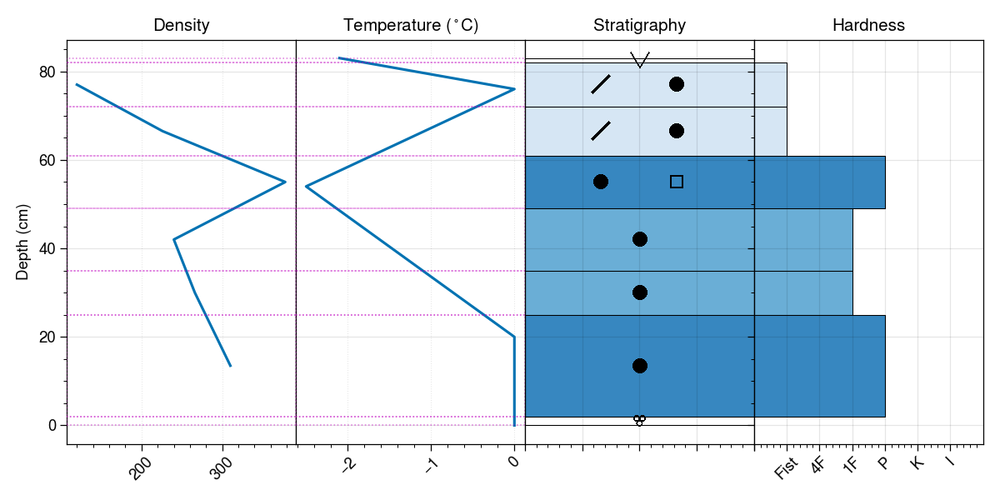

In [13]:
date = '199501171000' # UTC
path_lejeune2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/CRYOBSCLIM_CDP'

p = pc.Snowpit()
p.caaml_file = path_lejeune2019+'/CRYOBSCLIM.CDP.2018.SnowProfile/SnowProfile/colDePorte_'+date+'.caaml'
p.import_caamlv6()
p.plot(plot_order=['density', 'temperature', 'stratigraphy', 'hardness'])

Theoric snow temperature within CLASSIC: https://cccma.gitlab.io/classic/snowHeatCond_8f90.html#details

In [14]:
ds_hh = ds_hh_list[0]

In [15]:
ds_h_eval_menard2019.sel(time=date).ts

<xarray.DataArray 'ts' ()> Size: 4B
array(-8.2, dtype=float32)
Coordinates:
    time     datetime64[ns] 8B 1995-01-17T10:00:00
Attributes:
    long_name:  surface temperature
    units:      C

In [86]:
ds_hh.sel(time=date).ts

<xarray.DataArray 'ts' (time: 1)> Size: 8B
array([272.66059766])
Coordinates:
  * time     (time) datetime64[ns] 8B 1997-01-15T11:00:00
Attributes:
    long_name:   Surface (skin) temperature
    units:       K
    nameInCode:  tsurf_hh

In [87]:
ds_hh.sel(time=date).tsn.values

array([-0.63418467])

In [90]:
b

array([-0.00344921])

In [93]:
date='1995-01-17T12:00:00'
def T(z, a, b, c):
    return 1/2*a*z**2 + b*z + c

z = np.linspace(0, ds_hh.sel(time=date).snd.squeeze()*100)
c = (ds_hh.sel(time=date).ts-273.15).values
b = ((-3/(ds_hh.sel(time=date).snd*100))*(c-ds_hh.sel(time=date).tsn.values)).values
a = (-b/(ds_hh.sel(time=date).snd*100)).values
tsn_theoric = T(z, a, b, c)

tsn_obs = np.trapz(p.temperature_profile.temp, x=-p.temperature_profile.depth)/p.temperature_profile.depth[0]
tsn_th = np.trapz(tsn_theoric, x=z)/z[-1]
print('Snow temperature from obs: {:.2f}'.format(tsn_obs)+' °C')
print('Theoric snow temperature (model): {:.2f}'.format(tsn_th.item(0))+' °C')
print('Snow temperature from model: {:.2f}'.format(ds_hh.sel(time=date).tsn.values.item(0))+' °C')

Snow temperature from obs: -3.11 °C
Theoric snow temperature (model): -1.57 °C
Snow temperature from model: -1.57 °C


In [17]:
ds_h_eval_menard2019.sel(time='1995-01-17T12:00:00').snd_man

<xarray.DataArray 'snd_man' ()> Size: 4B
array(0.8, dtype=float32)
Coordinates:
    time     datetime64[ns] 8B 1995-01-17T12:00:00
Attributes:
    long_name:  snowdepth, manual measurement
    units:      m

In [18]:
ds_h_eval_menard2019.sel(time='1995-01-17T12:00:00').ts

<xarray.DataArray 'ts' ()> Size: 4B
array(-3.5, dtype=float32)
Coordinates:
    time     datetime64[ns] 8B 1995-01-17T12:00:00
Attributes:
    long_name:  surface temperature
    units:      C

In [22]:
p.density_profile.density

array([120., 226., 378., 240., 266., 310.])

In [23]:
p.density_profile.depth

array([77. , 66.5, 55. , 42. , 30. , 13.5])

In [29]:
((120+226)/2*(77-66.5)+(226+378)/2*(66.5-55)+(378+240)/2*(55-42)+(240+266)/2*(42-30)+(266+310)/2*(30-13.5))/(77-13.5)

269.20472440944883

In [27]:
np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1])

269.20472440944883

In [19]:
p.temperature_profile.depth

array([83., 76., 54., 20.,  0.])

In [20]:
p.temperature_profile.temp

array([-2.1,  0. , -2.5,  0. ,  0. ])

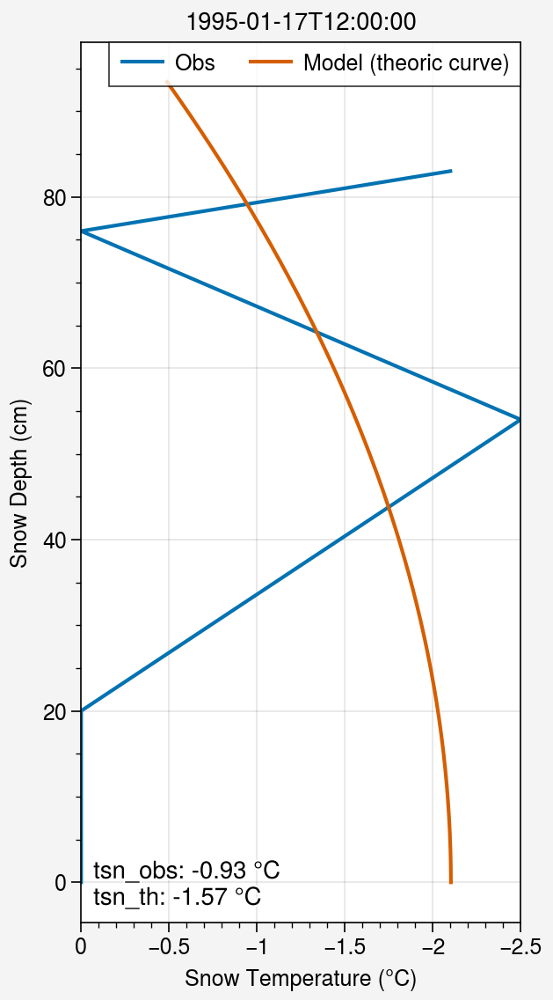

In [21]:
%matplotlib inline
fig, axs = pplt.subplots(refaspect=0.5)

axs[0].plot(p.temperature_profile.temp, p.temperature_profile.depth, label='Obs')
axs[0].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
axs[0].legend()

axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
             lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

### Snow profiles

Not easy to say if our forcing data are in local time and need to convert here or not...

In [30]:
from snowpyt import pit_class as pc

Theoric snow temperature within CLASSIC: https://cccma.gitlab.io/classic/snowHeatCond_8f90.html#details

In [31]:
import os

def sorted_directory_listing_with_os_listdir(directory):
    items = os.listdir(directory)
    sorted_items = sorted(items)
    return sorted_items

In [32]:
mypath = path_lejeune2019+'/CRYOBSCLIM.CDP.2018.SnowProfile/SnowProfile/'
files = sorted_directory_listing_with_os_listdir(mypath)

In [33]:
tsn_obs_profile_list = []
depth_obs_profile_list = []
tsn_obs = []
dens_obs_profile_list = []
depth_dens_obs_profile_list = []
dens_obs = []
date_obs = []
for file in files:
    p = pc.Snowpit()
    p.caaml_file = path_lejeune2019+'/CRYOBSCLIM.CDP.2018.SnowProfile/SnowProfile/'+file
    p.import_caamlv6(print2term=False)
    # Temperature
    try:
        tsn_obs.append(np.trapz(p.temperature_profile.temp, x=-p.temperature_profile.depth)/(p.temperature_profile.depth[0]-p.temperature_profile.depth[-1]))
        tsn_obs_profile_list.append(list(p.temperature_profile.temp))
        depth_obs_profile_list.append(list(p.temperature_profile.depth))
    except AttributeError:
        tsn_obs.append(np.nan)
        tsn_obs_profile_list.append([np.nan])
        depth_obs_profile_list.append([np.nan])
                       
    # Density
    try:
        dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
        dens_obs_profile_list.append(list(p.density_profile.density))
        depth_dens_obs_profile_list.append(list(p.density_profile.depth))
    except AttributeError:
        dens_obs.append(np.nan)
        dens_obs_profile_list.append([np.nan])
        depth_dens_obs_profile_list.append([np.nan])

    date_obs.append(p.metadata.date)
    # p.plot(plot_order=['density', 'temperature', 'stratigraphy', 'hardness'])

/tmp/ipykernel_14376/2027953912.py:24: RuntimeWarning: invalid value encountered in scalar divide
  dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
/tmp/ipykernel_14376/2027953912.py:24: RuntimeWarning: invalid value encountered in scalar divide
  dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
/tmp/ipykernel_14376/2027953912.py:24: RuntimeWarning: invalid value encountered in scalar divide
  dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
/tmp/ipykernel_14376/2027953912.py:24: RuntimeWarning: invalid value encountered in scalar divide
  dens_obs.append(np.trapz(p.density_profile.density, x=-p.density_profile.depth)/(p.density_profile.depth[0]-p.density_profile.depth[-1]))
/tmp/ipykernel_14376/2027953912.py:24: RuntimeWa

In [34]:
d = {'tsn': tsn_obs}
# df_tsn = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_convert('Europe/Paris').tz_localize(None))
df_tsn = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_localize(None) + pd.Timedelta(hours=2)) # to avoid the day light savings adjustment
df_tsn = df_tsn.dropna()
ds_tsn_loc = df_tsn.to_xarray()
ds_tsn_loc = ds_tsn_loc.rename({'index': 'time'})
ds_tsn_loc = ds_tsn_loc.reindex({'time': pd.date_range(ds_tsn_loc.tsn.time[0].values, ds_tsn_loc.tsn.time[-1].values, freq='H')})

In [35]:
d = {'tsn': tsn_obs}
df_tsn = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_localize(None))
df_tsn = df_tsn.dropna()
ds_tsn = df_tsn.to_xarray()
ds_tsn = ds_tsn.rename({'index': 'time'})
ds_tsn = ds_tsn.reindex({'time': pd.date_range(ds_tsn.tsn.time[0].values, ds_tsn.tsn.time[-1].values, freq='H')})

In [36]:
d = {'dens': dens_obs}
df_dens = pd.DataFrame(data=d, index=pd.to_datetime(date_obs).tz_localize(None))
df_dens = df_dens.dropna()
ds_dens = df_dens.to_xarray()
ds_dens = ds_dens.rename({'index': 'time'})
ds_dens = ds_dens.reindex({'time': pd.date_range(ds_dens.dens.time[0].values, ds_dens.dens.time[-1].values, freq='H')})

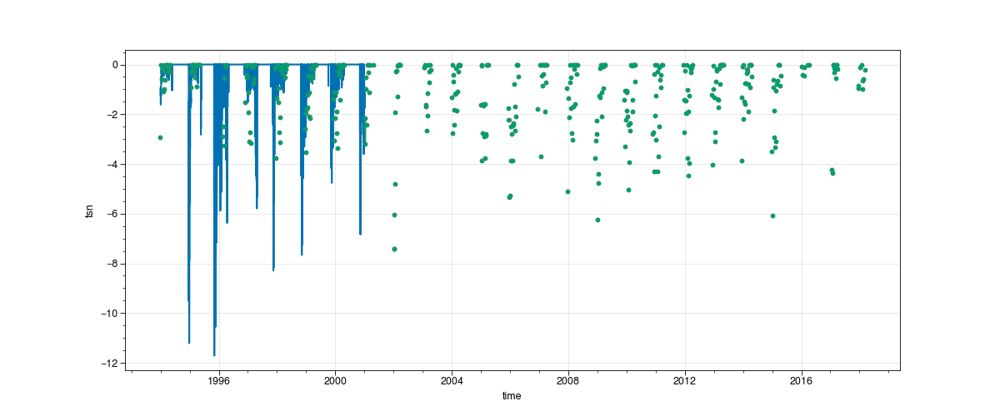

In [37]:
%matplotlib widget
plt.figure(figsize=(12,5))
ds_hh.tsn.plot()
ds_tsn_loc.tsn.plot(marker='.')
ds_tsn.tsn.plot(marker='.')

In [43]:
ds_tcs = (0.234e-3*ds_dens.dens + 0.023).where(ds_dens.dens < 156, 
                                               other=3.233e-6 * ds_dens.dens**2 - 1.01e-3*ds_dens.dens + 0.138)

In [100]:
ds_d_tcsnow = (0.234e-3*ds_d.snwdens + 0.023).where(ds_d.snwdens < 156, 
                                               other=3.233e-6 * ds_d.snwdens**2 - 1.01e-3*ds_d.snwdens + 0.138)

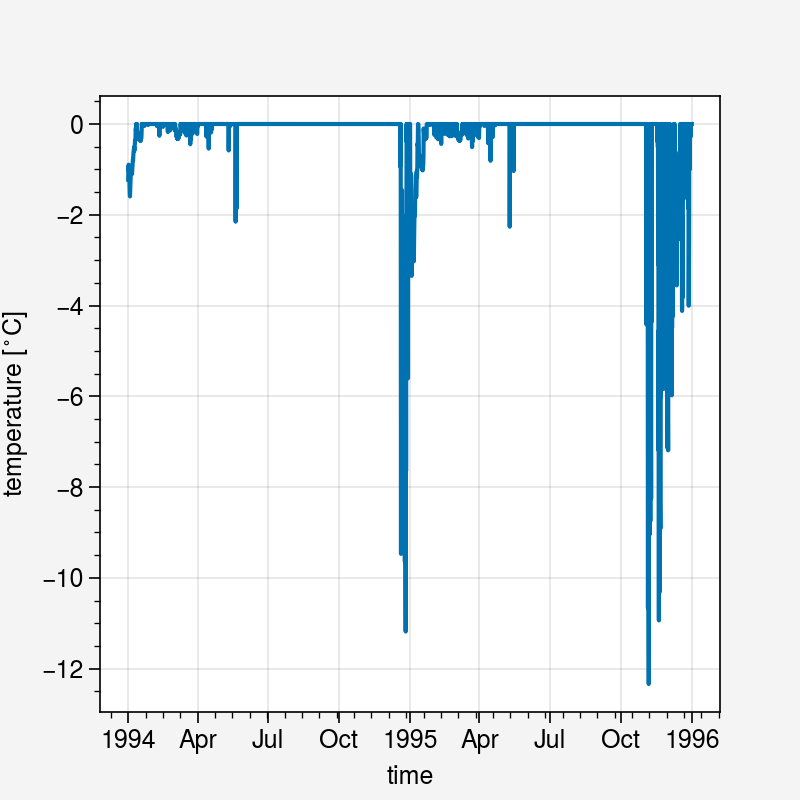

In [71]:
%matplotlib inline
ds_hh_list[1].tsn.plot()

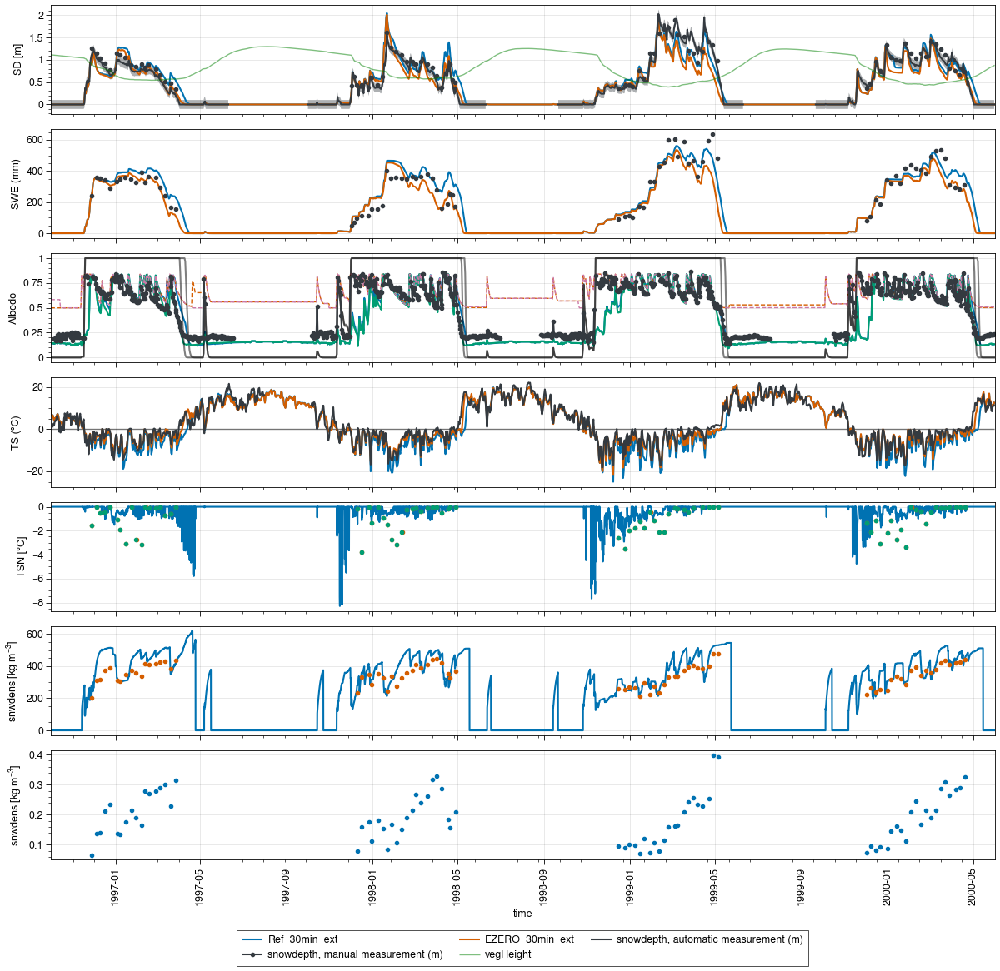

In [94]:
%matplotlib widget
# fig, axs = pplt.subplots(nrows=7, figsize=(12,5), sharey=0)
fig, axs = pplt.subplots(nrows=7, figsize=(12,5*7/3), sharey=0)

period=slice('10-1996', '05-2000')



##################
### Snow Depth ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snd.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
axs[0].plot(ds_d_eval_menard2019.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[0].plot(ds_d_eval_menard2019.snd_man.sel(time=period), marker='.', color=color_obs)

# Veg
axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)
axs[0].format(ylabel='SD [m]')

fig.legend(loc='b', ncols=3)

##################
### SWE ###
##################
 # Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snw.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
axs[1].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[1].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.', color=color_obs)

# axs[1].legend(loc='ul', ncols=2)
axs[1].format(ylabel='SWE (mm)')

##################
### Albedo ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[2].plot(ds_d.albs.sel(time=period), label=label+' (albs)')
    axs[2].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', ls='--', lw=1)
    axs[2].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)

# Obs
axs[2].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color=color_obs)

# axs[2].legend(loc='ul', ncols=2)
axs[2].format(ylabel='Albedo')


##################
### TS ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[3].plot(ds_d.ts.sel(time=period)-273.15, label=label)

# Obs
axs[3].plot(ds_d_eval_menard2019.ts.sel(time=period), color=color_obs)
axs[3].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)

# axs[3].legend(loc='ul', ncols=2)
axs[3].format(ylabel='TS (°C)')




axs[4].plot(ds_hh.tsn.sel(time=period))
# axs[4].plot(ds_hh_list[1].tsn.sel(time=period)) -> plus chaud 
axs[4].plot(ds_tsn_loc.tsn.sel(time=period), marker='.')
axs[4].plot(ds_tsn.tsn.sel(time=period), marker='.')
axs[4].format(ylabel='TSN [°C]')

axs[5].plot(ds_hh.snwdens.sel(time=period))
axs[5].plot(ds_dens.dens.sel(time=period), marker='.')
axs[5].format(ylabel='snwdens [kg m$^{-3}$]')

# axs[3].plot(ds_hh.snwdens.sel(time=period))
axs[6].plot(ds_tcs.sel(time=period), marker='.')
axs[6].format(ylabel='snwdens [kg m$^{-3}$]')

Text(0.5, 0.98, 'Col de Porte, France')

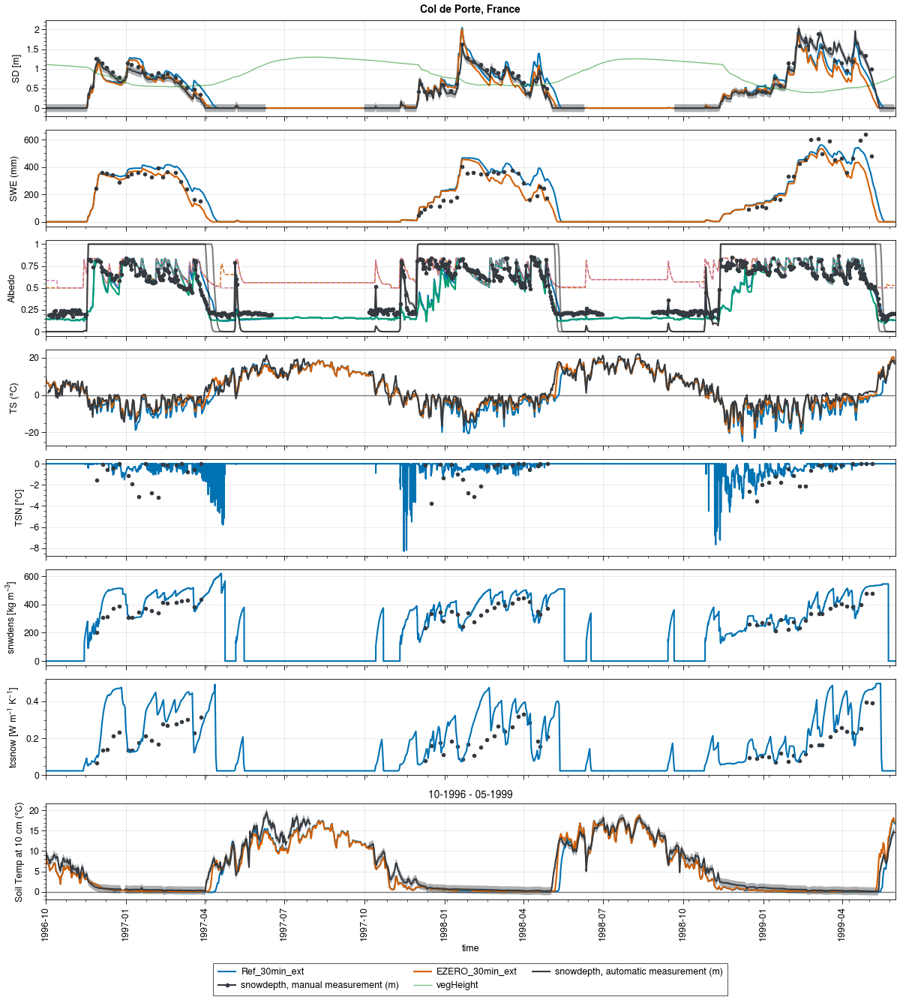

In [112]:
%matplotlib widget
# fig, axs = pplt.subplots(nrows=7, figsize=(12,5), sharey=0)
fig, axs = pplt.subplots(nrows=8, figsize=(12,5*8/3), sharey=0)

period=slice('10-1996', '05-1999')



##################
### Snow Depth ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snd.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
axs[0].plot(ds_d_eval_menard2019.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[0].plot(ds_d_eval_menard2019.snd_man.sel(time=period), marker='.', color=color_obs)

# Veg
axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)
axs[0].format(ylabel='SD [m]')

fig.legend(loc='b', ncols=3)

##################
### SWE ###
##################
 # Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snw.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
axs[1].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[1].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.', color=color_obs)

# axs[1].legend(loc='ul', ncols=2)
axs[1].format(ylabel='SWE (mm)')

##################
### Albedo ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[2].plot(ds_d.albs.sel(time=period), label=label+' (albs)')
    axs[2].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', ls='--', lw=1)
    axs[2].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)

# Obs
axs[2].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color=color_obs)

# axs[2].legend(loc='ul', ncols=2)
axs[2].format(ylabel='Albedo')


##################
### TS ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[3].plot(ds_d.ts.sel(time=period)-273.15, label=label)

# Obs
axs[3].plot(ds_d_eval_menard2019.ts.sel(time=period), color=color_obs)
axs[3].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)

# axs[3].legend(loc='ul', ncols=2)
axs[3].format(ylabel='TS (°C)')




axs[4].plot(ds_hh.tsn.sel(time=period))
# axs[4].plot(ds_hh_list[1].tsn.sel(time=period)) -> plus chaud 
# axs[4].plot(ds_tsn_loc.tsn.sel(time=period), marker='.', color=color_obs)
axs[4].plot(ds_tsn.tsn.sel(time=period), marker='.', color=color_obs)
axs[4].format(ylabel='TSN [°C]')

axs[5].plot(ds_hh.snwdens.sel(time=period))
axs[5].plot(ds_dens.dens.sel(time=period), marker='.', color=color_obs)
axs[5].format(ylabel='snwdens [kg m$^{-3}$]')

# axs[3].plot(ds_hh.snwdens.sel(time=period))
axs[6].plot(ds_tcs.sel(time=period), marker='.', color=color_obs)
axs[6].plot(ds_d_tcsnow.sel(time=period))
axs[6].format(ylabel='tcsnow [W m$^{-1}$ K$^{-1}$]')




##################
### T soil ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[7].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.1)-273.15, label=label)
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
axs[7].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, color=color_obs)

axs[7].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[7].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 10 cm (°C)')

fig.suptitle(site_longname)


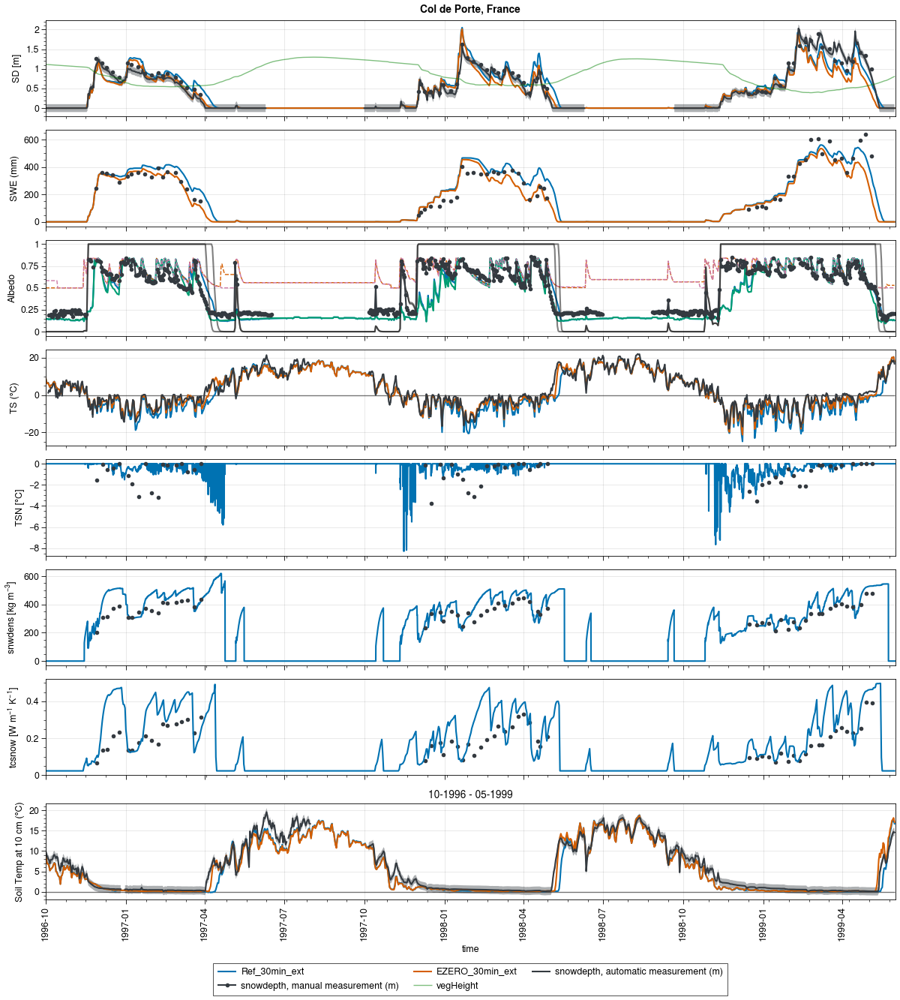

In [198]:
%matplotlib widget
# fig, axs = pplt.subplots(nrows=7, figsize=(12,5), sharey=0)
fig, axs = pplt.subplots(nrows=8, figsize=(12,5*8/3), sharey=0)

period=slice('10-1996', '05-1999')



##################
### Snow Depth ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snd.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
axs[0].plot(ds_d_eval_menard2019.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[0].plot(ds_d_eval_menard2019.snd_man.sel(time=period), marker='.', color=color_obs)

# Veg
axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)
axs[0].format(ylabel='SD [m]')

fig.legend(loc='b', ncols=3)

##################
### SWE ###
##################
 # Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snw.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
axs[1].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[1].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.', color=color_obs)

# axs[1].legend(loc='ul', ncols=2)
axs[1].format(ylabel='SWE (mm)')

##################
### Albedo ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[2].plot(ds_d.albs.sel(time=period), label=label+' (albs)')
    axs[2].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', ls='--', lw=1)
    axs[2].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)

# Obs
axs[2].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color=color_obs)

# axs[2].legend(loc='ul', ncols=2)
axs[2].format(ylabel='Albedo')


##################
### TS ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[3].plot(ds_d.ts.sel(time=period)-273.15, label=label)
# axs[3].plot(ds_hh.ts.sel(time=period)-273.15, label=label)


# Obs
axs[3].plot(ds_d_eval_menard2019.ts.sel(time=period), color=color_obs)
# axs[3].plot(ds_h_eval_menard2019.ts.sel(time=period), color=color_obs)
axs[3].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)

# axs[3].legend(loc='ul', ncols=2)
axs[3].format(ylabel='TS (°C)')




axs[4].plot(ds_hh.tsn.sel(time=period))
# axs[4].plot(ds_hh_list[1].tsn.sel(time=period)) -> plus chaud 
# axs[4].plot(ds_tsn_loc.tsn.sel(time=period), marker='.', color=color_obs)
axs[4].plot(ds_tsn.tsn.sel(time=period), marker='.', color=color_obs)
axs[4].format(ylabel='TSN [°C]')

axs[5].plot(ds_hh.snwdens.sel(time=period))
axs[5].plot(ds_dens.dens.sel(time=period), marker='.', color=color_obs)
axs[5].format(ylabel='snwdens [kg m$^{-3}$]')

# axs[3].plot(ds_hh.snwdens.sel(time=period))
axs[6].plot(ds_tcs.sel(time=period), marker='.', color=color_obs)
axs[6].plot(ds_d_tcsnow.sel(time=period))
axs[6].format(ylabel='tcsnow [W m$^{-1}$ K$^{-1}$]')




##################
### T soil ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[7].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.1)-273.15, label=label)
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
axs[7].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, color=color_obs)

axs[7].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[7].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 10 cm (°C)')

fig.suptitle(site_longname)
# fig.save('img/cdp_ex_analysis.jpg')

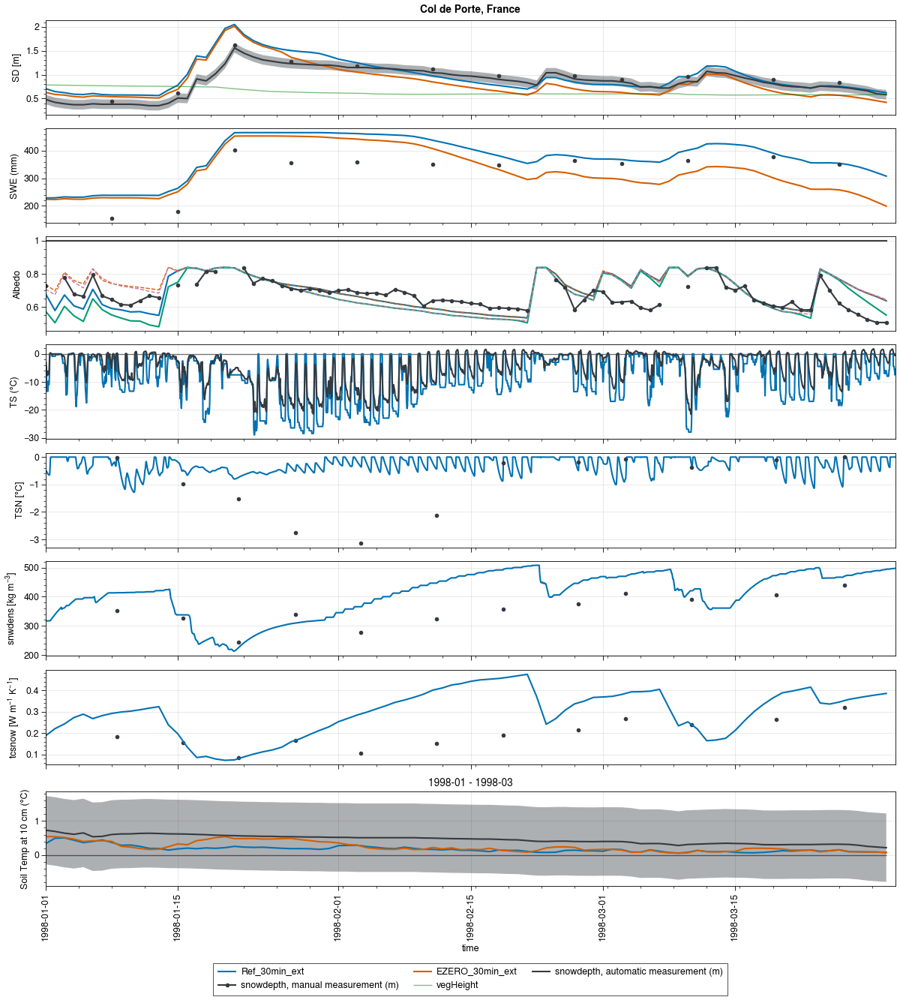

In [202]:
%matplotlib widget
# fig, axs = pplt.subplots(nrows=7, figsize=(12,5), sharey=0)
fig, axs = pplt.subplots(nrows=8, figsize=(12,5*8/3), sharey=0)

period=slice('1998-01', '1998-03')



##################
### Snow Depth ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snd.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
axs[0].plot(ds_d_eval_menard2019.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[0].plot(ds_d_eval_menard2019.snd_man.sel(time=period), marker='.', color=color_obs)

# Veg
axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)
axs[0].format(ylabel='SD [m]')

fig.legend(loc='b', ncols=3)

##################
### SWE ###
##################
 # Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snw.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
    np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
axs[1].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
axs[1].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.', color=color_obs)

# axs[1].legend(loc='ul', ncols=2)
axs[1].format(ylabel='SWE (mm)')

##################
### Albedo ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[2].plot(ds_d.albs.sel(time=period), label=label+' (albs)')
    axs[2].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', ls='--', lw=1)
    axs[2].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)

# Obs
axs[2].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color=color_obs)

# axs[2].legend(loc='ul', ncols=2)
axs[2].format(ylabel='Albedo')


##################
### TS ###
##################
# Simus
# for ds_d, label in zip(ds_d_list, labels):
#     axs[3].plot(ds_d.ts.sel(time=period)-273.15, label=label)
axs[3].plot(ds_hh.ts.sel(time=period)-273.15, label=label)


# Obs
# axs[3].plot(ds_d_eval_menard2019.ts.sel(time=period), color=color_obs)
axs[3].plot(ds_h_eval_menard2019.ts.sel(time=period), color=color_obs)
axs[3].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)

# axs[3].legend(loc='ul', ncols=2)
axs[3].format(ylabel='TS (°C)')




axs[4].plot(ds_hh.tsn.sel(time=period))
# axs[4].plot(ds_hh_list[1].tsn.sel(time=period)) -> plus chaud 
# axs[4].plot(ds_tsn_loc.tsn.sel(time=period), marker='.', color=color_obs)
axs[4].plot(ds_tsn.tsn.sel(time=period), marker='.', color=color_obs)
axs[4].format(ylabel='TSN [°C]')

axs[5].plot(ds_hh.snwdens.sel(time=period))
axs[5].plot(ds_dens.dens.sel(time=period), marker='.', color=color_obs)
axs[5].format(ylabel='snwdens [kg m$^{-3}$]')

# axs[3].plot(ds_hh.snwdens.sel(time=period))
axs[6].plot(ds_tcs.sel(time=period), marker='.', color=color_obs)
axs[6].plot(ds_d_tcsnow.sel(time=period))
axs[6].format(ylabel='tcsnow [W m$^{-1}$ K$^{-1}$]')




##################
### T soil ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[7].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.1)-273.15, label=label)
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
    np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
axs[7].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, color=color_obs)

axs[7].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[7].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 10 cm (°C)')

fig.suptitle(site_longname)
# fig.save('img/cdp_ex_analysis_zoom_hourly.jpg')

In [107]:
ds_hh_list[0]

<xarray.Dataset> Size: 125MB
Dimensions:     (time: 122736, layer: 20)
Coordinates:
  * time        (time) datetime64[ns] 982kB 1994-01-01 ... 2000-12-31T23:30:00
  * layer       (layer) float64 160B 0.05 0.15 0.25 0.35 ... 8.9 18.9 41.4 58.9
Data variables: (12/52)
    longitude   float64 8B 5.77
    latitude    float64 8B 45.3
    albs        (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    cdh         (time) float64 982kB 0.000277 0.0003388 ... 8.856e-07 6.224e-07
    cdm         (time) float64 982kB 0.0001389 0.0001757 ... 3.193e-07 2.232e-07
    evspsblsoi  (time) float64 982kB -1.157e-07 -5.26e-08 ... 7.55e-08 8.231e-08
    ...          ...
    tsgs        (time) float64 982kB 272.2 272.2 272.2 ... 249.9 249.9 249.9
    tsl         (time, layer) float64 20MB 273.2 274.0 274.2 ... 278.9 278.9
    tsn         (time) float64 982kB -1.227 -1.191 -1.156 ... -1.733 -1.746
    uvas        (time) float64 982kB 0.7 0.6 0.5 0.5 0.5 ... 1.0 1.05 1.1 0.95
    wsnw        (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    zpond       (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        CLASSIC output file
    timestamp:    20240424 1059
    Conventions:  COARDS
    node_offset:  1
    Comment:       run_Ref_30min_ext

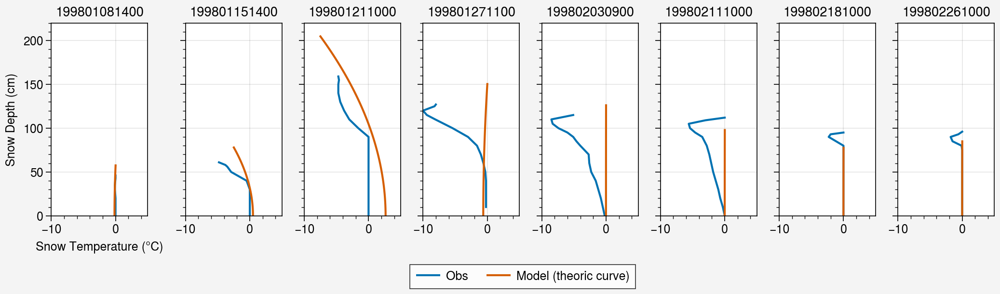

In [197]:
%matplotlib inline
import math

ncols = 8
data_range = [file[11:-6] for file in files]
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(len(data_range)/ncols), refwidth=1)

for i, date in enumerate(data_range):
    
    # axs[i].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
    #             label='Snow Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.')
    axs[i].plot(p_list[i].temperature_profile.temp, p_list[i].temperature_profile.depth, label='Obs')
    axs[i].plot(tsn_theoric_list[i].squeeze(), z_list[i][::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    # axs[i].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_list[0].tsl.sel(time=date)-273.15, -ds_d_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-10, 5), ylim=(0, 220), title=date)
    # axs[i].hlines(0, -50, 0, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)')
fig.save('img/cdp_model_obs_tsn_profile.jpg')

In [169]:
ds_hh

<xarray.Dataset> Size: 125MB
Dimensions:     (time: 122736, layer: 20)
Coordinates:
  * time        (time) datetime64[ns] 982kB 1994-01-01 ... 2000-12-31T23:30:00
  * layer       (layer) float64 160B 0.05 0.15 0.25 0.35 ... 8.9 18.9 41.4 58.9
Data variables: (12/52)
    longitude   float64 8B 5.77
    latitude    float64 8B 45.3
    albs        (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    cdh         (time) float64 982kB 0.000277 0.0003388 ... 8.856e-07 6.224e-07
    cdm         (time) float64 982kB 0.0001389 0.0001757 ... 3.193e-07 2.232e-07
    evspsblsoi  (time) float64 982kB -1.157e-07 -5.26e-08 ... 7.55e-08 8.231e-08
    ...          ...
    tsgs        (time) float64 982kB 272.2 272.2 272.2 ... 249.9 249.9 249.9
    tsl         (time, layer) float64 20MB 273.2 274.0 274.2 ... 278.9 278.9
    tsn         (time) float64 982kB -1.227 -1.191 -1.156 ... -1.733 -1.746
    uvas        (time) float64 982kB 0.7 0.6 0.5 0.5 0.5 ... 1.0 1.05 1.1 0.95
    wsnw        (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    zpond       (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        CLASSIC output file
    timestamp:    20240424 1059
    Conventions:  COARDS
    node_offset:  1
    Comment:       run_Ref_30min_ext

In [171]:
pd.date_range('1998-01-21T00:00:00.000000000', '1998-01-22T00:00:00.000000000', freq='h')

DatetimeIndex(['1998-01-21 00:00:00', '1998-01-21 01:00:00',
               '1998-01-21 02:00:00', '1998-01-21 03:00:00',
               '1998-01-21 04:00:00', '1998-01-21 05:00:00',
               '1998-01-21 06:00:00', '1998-01-21 07:00:00',
               '1998-01-21 08:00:00', '1998-01-21 09:00:00',
               '1998-01-21 10:00:00', '1998-01-21 11:00:00',
               '1998-01-21 12:00:00', '1998-01-21 13:00:00',
               '1998-01-21 14:00:00', '1998-01-21 15:00:00',
               '1998-01-21 16:00:00', '1998-01-21 17:00:00',
               '1998-01-21 18:00:00', '1998-01-21 19:00:00',
               '1998-01-21 20:00:00', '1998-01-21 21:00:00',
               '1998-01-21 22:00:00', '1998-01-21 23:00:00',
               '1998-01-22 00:00:00'],
              dtype='datetime64[ns]', freq='H')

In [181]:
tsn_theoric

array([-7.48776003, -7.08207094, -6.68474657, -6.29578693, -5.91519202,
       -5.54296182, -5.17909635, -4.8235956 , -4.47645958, -4.13768828,
       -3.8072817 , -3.48523985, -3.17156272, -2.86625031, -2.56930263,
       -2.28071967, -2.00050143, -1.72864792, -1.46515913, -1.21003507,
       -0.96327573, -0.72488111, -0.49485121, -0.27318604, -0.05988559,
        0.14505013,  0.34162114,  0.52982741,  0.70966897,  0.8811458 ,
        1.04425791,  1.19900529,  1.34538795,  1.48340589,  1.6130591 ,
        1.73434759,  1.84727136,  1.9518304 ,  2.04802472,  2.13585432,
        2.21531919,  2.28641934,  2.34915477,  2.40352547,  2.44953145,
        2.4871727 ,  2.51644924,  2.53736104,  2.54990813,  2.55409049])

In [176]:
ds_hh.sel(time=date).ts

<xarray.DataArray 'ts' ()> Size: 8B
array(263.66364287)
Coordinates:
    time     datetime64[ns] 8B 1998-01-22
Attributes:
    long_name:   Surface (skin) temperature
    units:       K
    nameInCode:  tsurf_hh

In [177]:
ds_hh.sel(time=date).tsn

<xarray.DataArray 'tsn' ()> Size: 8B
array(-0.64711041)
Coordinates:
    time     datetime64[ns] 8B 1998-01-22
Attributes:
    long_name:   Bulk temperature of the snow, not the surface (skin) tempera...
    units:       $^\circ$C
    nameInCode:  tsno_hh

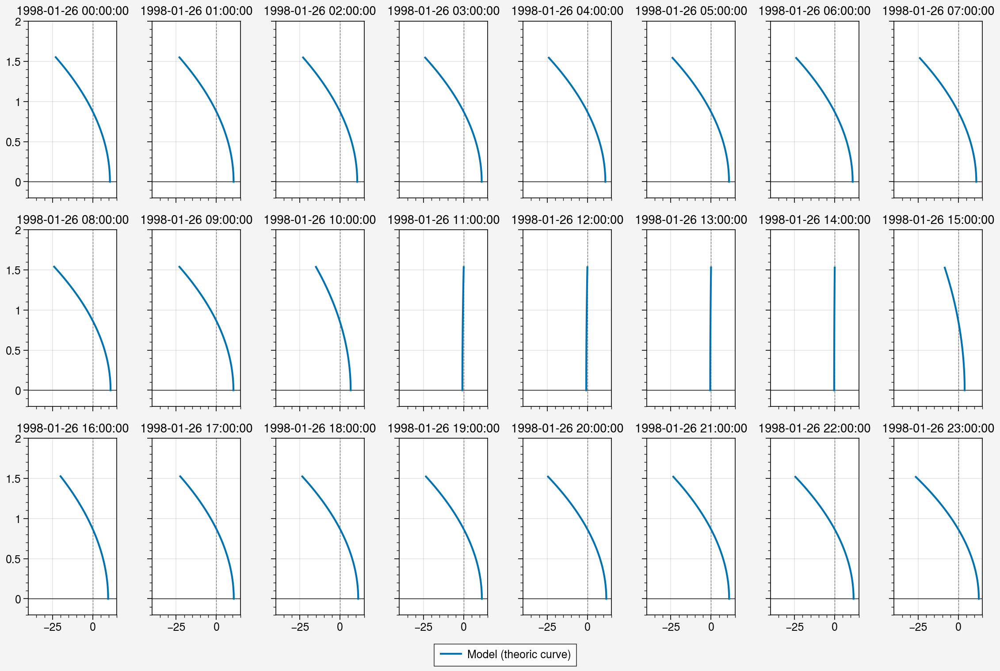

In [196]:
%matplotlib inline
import math
data_range = pd.date_range('1998-01-26T00:00:00.000000000', '1998-01-26T23:00:00.000000000', freq='h')
# data_range = pd.date_range('1998-01-21T00:00:00.000000000', '1998-01-22T00:00:00.000000000', freq='h')
# data_range = pd.date_range('1998-01-21T00:00:00.000000000', '1998-01-21T02:00:00.000000000', freq='h')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_hh.sel(time=date).snd.squeeze())
    c = (ds_hh.sel(time=date).ts-273.15).values
    b = ((-3/ds_hh.sel(time=date).snd)*(c-ds_hh.sel(time=date).tsn.values)).values
    a = (-b/ds_hh.sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    # axs[i].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
    #             label='Snow Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    # axs[i].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_list[0].tsl.sel(time=date)-273.15, -ds_d_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-40, 15), ylim=(-0.2, 2), title=date)
    axs[i].hlines(0, -40, 15, color='k', lw=0.5)
    axs[i].vlines(0, -0.2, 2, color='k', lw=0.5, ls='--', alpha=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')
fig.save('img/cdp_model_tsn_profile.jpg')

In [123]:
files = ['colDePorte_199801081400.caaml',
'colDePorte_199801151400.caaml',
'colDePorte_199801211000.caaml',
'colDePorte_199801271100.caaml',
'colDePorte_199802030900.caaml',
'colDePorte_199802111000.caaml',
'colDePorte_199802181000.caaml',
'colDePorte_199802261000.caaml']

path_lejeune2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/CRYOBSCLIM_CDP/CRYOBSCLIM.CDP.2018.SnowProfile/SnowProfile/'


p_list = []
for file in files:
    p = pc.Snowpit()
    p.caaml_file = path_lejeune2019+file
    p.import_caamlv6(print2term=False)
    p_list.append(p)

In [130]:
[file[11:-6] for file in files]

['199801081400',
 '199801151400',
 '199801211000',
 '199801271100',
 '199802030900',
 '199802111000',
 '199802181000',
 '199802261000']

In [127]:
[file[11:-10]+'1200' for file in files]

['199801081200',
 '199801151200',
 '199801211200',
 '199801271200',
 '199802031200',
 '199802111200',
 '199802181200',
 '199802261200']

In [136]:
ds_hh.sel(time=date).tsn

<xarray.DataArray 'tsn' (time: 1)> Size: 8B
array([-0.49300899])
Coordinates:
  * time     (time) datetime64[ns] 8B 1998-02-26T10:00:00
Attributes:
    long_name:   Bulk temperature of the snow, not the surface (skin) tempera...
    units:       $^\circ$C
    nameInCode:  tsno_hh

In [150]:
dates

['199801081200',
 '199801151200',
 '199801211200',
 '199801271200',
 '199802031200',
 '199802111200',
 '199802181200',
 '199802261200']

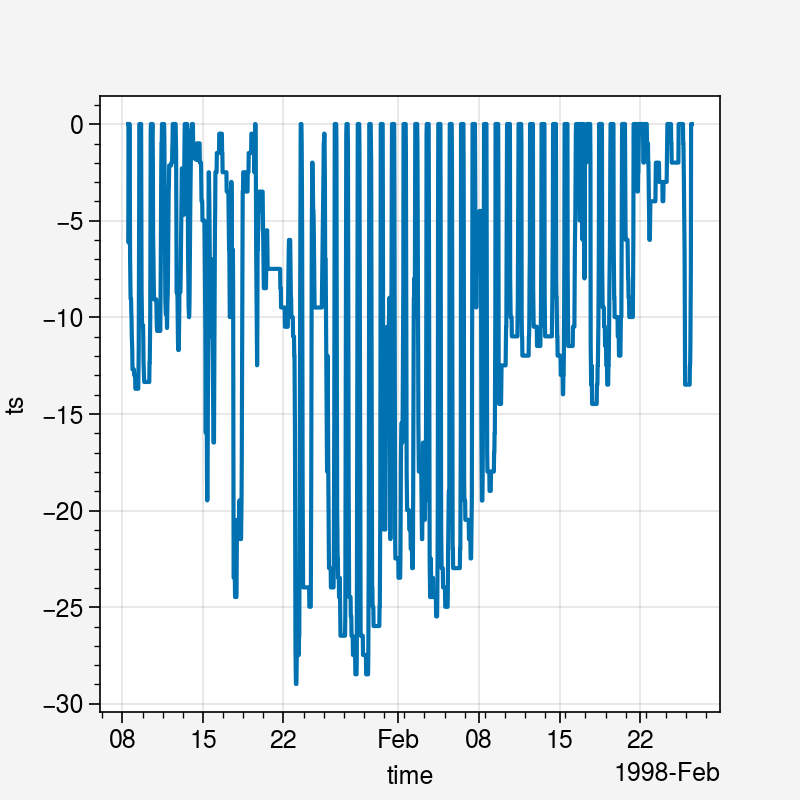

In [154]:
%matplotlib inline

(ds_hh.sel(time=slice(dates[0],dates[-1])).ts-273.15).plot()

In [167]:
dates = [file[11:-10]+'1200' for file in files]
# dates = [file[11:-6] for file in files]

def T(z, a, b, c):
    return 1/2*a*z**2 + b*z + c

z_list = []
tsn_theoric_list = []
for date in dates:
    z = np.linspace(0, ds_hh.sel(time=date).snd.squeeze()*100)
    c = (ds_hh.sel(time=date).ts-273.15).values
    print('Snow surf temper from model: {:.2f}'.format(ds_hh.sel(time=date).ts.values.item(0)-273.15)+' °C')
    # c = -7.5
    b = ((-3/(ds_hh.sel(time=date).snd*100))*(c-ds_hh.sel(time=date).tsn.values)).values
    a = (-b/(ds_hh.sel(time=date).snd*100)).values
    tsn_theoric = T(z, a, b, c)
    z_list.append(z)
    tsn_theoric_list.append(tsn_theoric)
    
    tsn_obs = np.trapz(p.temperature_profile.temp, x=-p.temperature_profile.depth)/p.temperature_profile.depth[0]
    tsn_th = np.trapz(tsn_theoric, x=z)/z[-1]
    print('Snow temperature from obs: {:.2f}'.format(tsn_obs)+' °C')
    print('Theoric snow temperature (model): {:.2f}'.format(tsn_th.item(0))+' °C')
    print('Snow temperature from model: {:.2f}'.format(ds_hh.sel(time=date).tsn.values.item(0))+' °C')

Snow surf temper from model: 0.01 °C
Snow temperature from obs: -0.18 °C
Theoric snow temperature (model): -0.10 °C
Snow temperature from model: -0.10 °C
Snow surf temper from model: -2.49 °C
Snow temperature from obs: -0.18 °C
Theoric snow temperature (model): -0.50 °C
Snow temperature from model: -0.50 °C
Snow surf temper from model: -7.49 °C
Snow temperature from obs: -0.18 °C
Theoric snow temperature (model): -0.73 °C
Snow temperature from model: -0.73 °C
Snow surf temper from model: 0.01 °C
Snow temperature from obs: -0.18 °C
Theoric snow temperature (model): -0.41 °C
Snow temperature from model: -0.41 °C
Snow surf temper from model: 0.01 °C
Snow temperature from obs: -0.18 °C
Theoric snow temperature (model): 0.00 °C
Snow temperature from model: 0.00 °C
Snow surf temper from model: 0.01 °C
Snow temperature from obs: -0.18 °C
Theoric snow temperature (model): 0.00 °C
Snow temperature from model: 0.00 °C
Snow surf temper from model: 0.01 °C
Snow temperature from obs: -0.18 °C
Theor

In [132]:
z

array([ 0.        ,  1.73333439,  3.46666879,  5.20000318,  6.93333758,
        8.66667197, 10.40000636, 12.13334076, 13.86667515, 15.60000955,
       17.33334394, 19.06667833, 20.80001273, 22.53334712, 24.26668151,
       26.00001591, 27.7333503 , 29.4666847 , 31.20001909, 32.93335348,
       34.66668788, 36.40002227, 38.13335667, 39.86669106, 41.60002545,
       43.33335985, 45.06669424, 46.80002864, 48.53336303, 50.26669742,
       52.00003182, 53.73336621, 55.46670061, 57.200035  , 58.93336939,
       60.66670379, 62.40003818, 64.13337258, 65.86670697, 67.60004136,
       69.33337576, 71.06671015, 72.80004454, 74.53337894, 76.26671333,
       78.00004773, 79.73338212, 81.46671651, 83.20005091, 84.9333853 ])

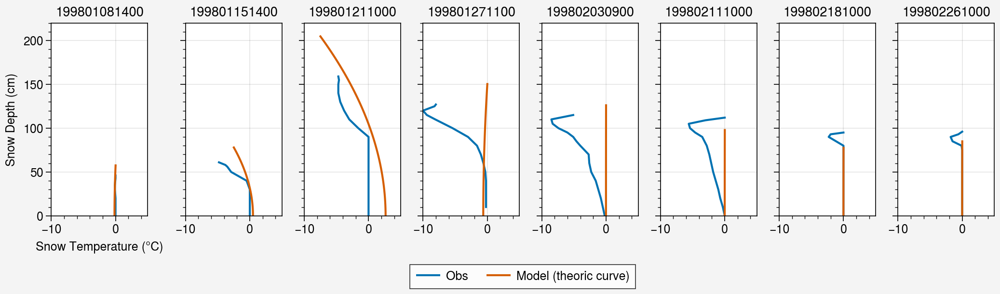

In [168]:
%matplotlib inline
import math

ncols = 8
data_range = [file[11:-6] for file in files]
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(len(data_range)/ncols), refwidth=1)

for i, date in enumerate(data_range):
    
    # axs[i].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
    #             label='Snow Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.')
    axs[i].plot(p_list[i].temperature_profile.temp, p_list[i].temperature_profile.depth, label='Obs')
    axs[i].plot(tsn_theoric_list[i].squeeze(), z_list[i][::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    # axs[i].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_list[0].tsl.sel(time=date)-273.15, -ds_d_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-10, 5), ylim=(0, 220), title=date)
    # axs[i].hlines(0, -50, 0, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)')

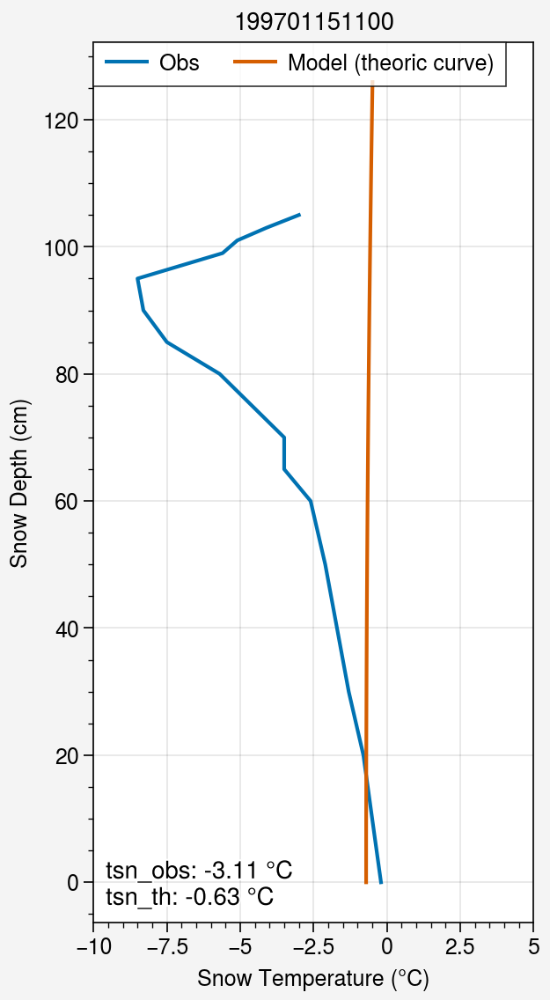

In [81]:
%matplotlib inline
fig, axs = pplt.subplots(refaspect=0.5)

axs[0].plot(p.temperature_profile.temp, p.temperature_profile.depth, label='Obs')
axs[0].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
axs[0].legend(loc='ul')

axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
             lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C',
             xlim=(-10, 5))

# fig.save('temp_profile_'+date+'.jpg')

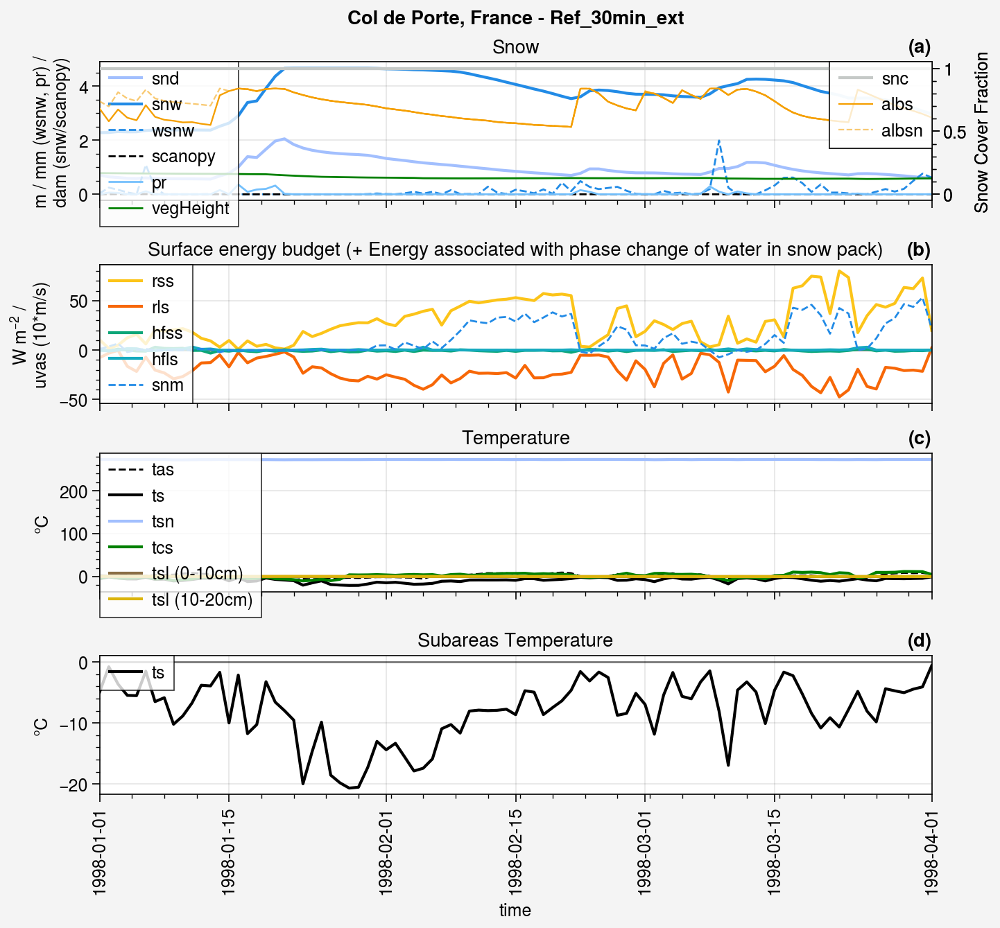

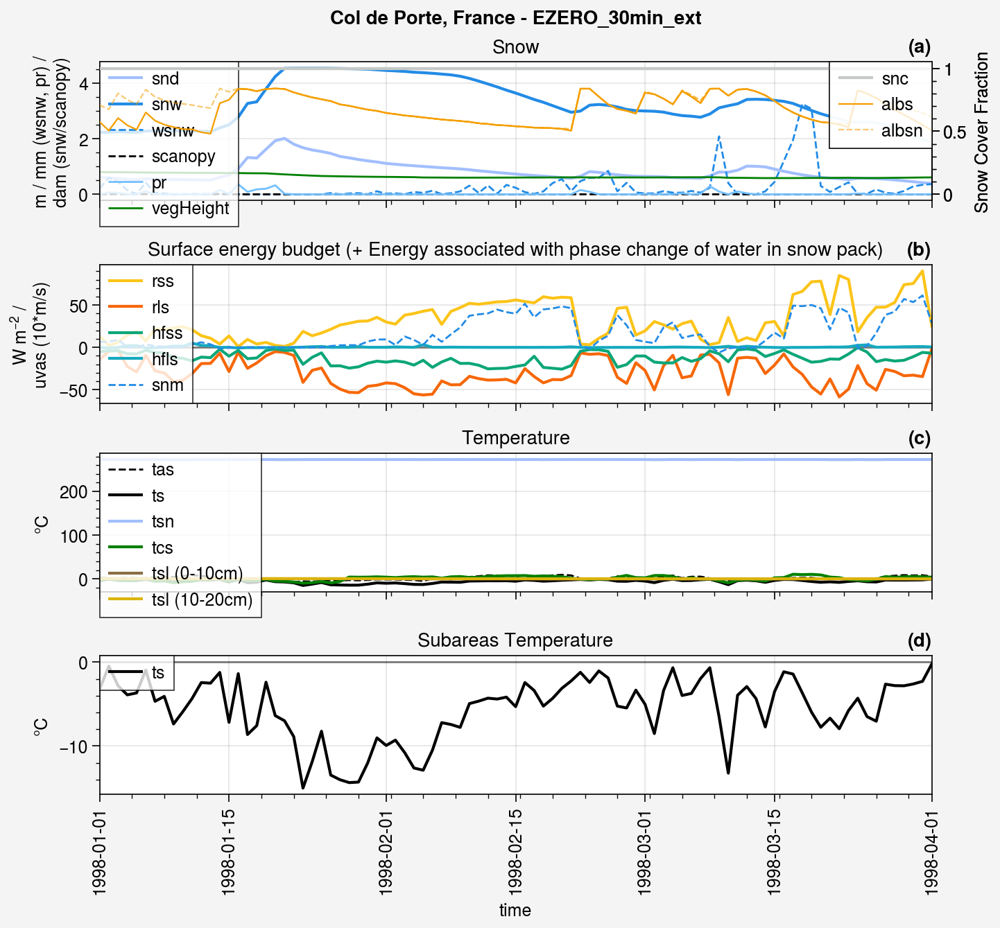

In [111]:
%matplotlib inline
for period in [
    slice('1998-01-01','1998-04-01'),
]:

    collabels = labels
    for i, (ds, ds_d) in enumerate(zip(ds_d_list, ds_d_list)):
        
        fig, axs = pplt.subplots(ncols=1, nrows=4, refaspect=6, refwidth=6, sharey=0)
    

        ##############################
        ### Snow related variables ###
        ##############################

        variables = {
            'snd': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snw': {'color': 'blue6', 'ls': '-', 'lw': 1.5, 'factor': 1e-3*10, 'shift': 0},
            'wsnw': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'scanopy': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1e-3*10, 'shift': 0},
            'pr': {'color': 'blue3', 'ls': '-', 'lw': 1, 'factor': 500, 'shift': 0},
        #     'albs': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
    #         'mrron': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        #     'snm': {'color': 'blue8', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
        }

        ax = axs[0]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot(ds_d.vegHeight.sel(time=period), label=ds_d.vegHeight.name, color='green', ls='-', lw=1)
        # ax.plot(ds_d.lai.sel(time=period), label='LAI', color='green', ls='-', lw=1)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='m / mm (wsnw, pr) /\ndam (snw/scanopy)', title='Snow')

        variables = {
            'snc': {'color': 'silver', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }
        ox = ax.alty(label='Snow Cover Fraction')
        for key in variables.keys():
            ox.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ox.plot(ds_d.albs.sel(time=period), label='albs', color='yellow7', ls='-', lw=0.8)
        ox.plot(ds_d.albsn.sel(time=period), label='albsn', color='yellow7', ls='--', lw=0.8, alpha=0.5)
        ox.legend(ncols=1, loc='ur')
        ox.format(ylim=(-0.05,1.05))


        ##############################
        ### Surface energy budget ###
        ##############################

        variables = {
            'rss': {'color': 'yellow5', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'rls': {'color': 'orange7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        #     'rlds': {'color': 'orange7', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'hfss': {'color': 'teal7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'hfls': {'color': 'cyan6', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snm': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            # 'uvas': {'color': 'gray', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        }

        ax = axs[1]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='W m$^{-2}$ /\nuvas (10*m/s)', title='Surface energy budget (+ Energy associated with phase change of water in snow pack)')


        ###################
        ### Temperature ###
        ###################

        variables = {
            'tas': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 273.15},
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},    
            'tsn': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'tcs': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[2]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot((ds.tsl-273.15).sel(time=period).isel(layer=0), label=ds.tsl.name+' (0-10cm)', color='dirt')
        ax.plot((ds.tsl-273.15).sel(time=period).isel(layer=1), label=ds.tsl.name+' (10-20cm)', color='gold')
        # ax.plot(ds_h_eval_menard2019.ts.sel(time=period), color='red', label='ts obs')
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Temperature')

        


        ############################
        ### Subareas Temperature ###
        ############################

        variables = {
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
        }

        ax = axs[3]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Subareas Temperature')

        fig.suptitle(site_longname+' - '+collabels[i])
        fig.format(abc='(a)', abcloc='r')
        # fig.save('img/'+labels[i]+'_hh.jpg')

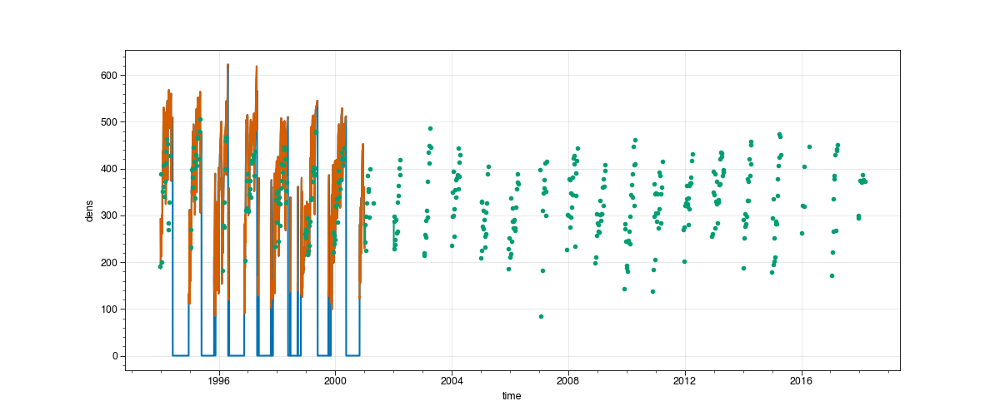

In [42]:
%matplotlib widget
plt.figure(figsize=(12,5))
ds_hh.snwdens.plot()
# (ds_hh.snw/ds_hh.snd).plot()
# ds_dens_loc.dens.plot(marker='.')
ds_dens.dens.plot(marker='.')

In [31]:
ds_d_list[0:1]

[<xarray.Dataset> Size: 7MB
 Dimensions:     (time: 7670, layer: 20)
 Coordinates:
   * time        (time) datetime64[ns] 61kB 1994-01-01 1994-01-02 ... 2014-12-31
   * layer       (layer) float64 160B 0.05 0.15 0.25 0.35 ... 8.9 18.9 41.4 58.9
 Data variables: (12/50)
     longitude   float64 8B 5.77
     latitude    float64 8B 45.3
     actlyr      (time) float64 61kB 61.4 61.4 61.4 61.4 ... 61.4 61.4 61.4 61.4
     albs        (time) float64 61kB 0.837 0.8391 0.8355 ... 0.7556 0.7109 0.6986
     albsir      (time) float64 61kB 0.7272 0.7293 0.7249 ... 0.655 0.6263 0.6067
     albsn       (time) float64 61kB 0.8394 0.84 0.836 ... 0.8062 0.8119 0.788
     ...          ...
     tsl         (time, layer) float64 1MB 273.2 273.9 274.1 ... 278.9 278.9
     tsn         (time) float64 61kB 272.1 271.9 271.7 ... 273.2 272.8 271.9
     vegHeight   (time) float64 61kB 0.6525 0.6396 0.6277 ... 0.6694 0.6626
     wsnw        (time) float64 61kB 0.0 0.0 0.0 0.0 ... 0.4417 0.08001 0.0
     wtd    

In [ ]:
ds

Text(0.5, 0.98, 'Col de Porte, France')

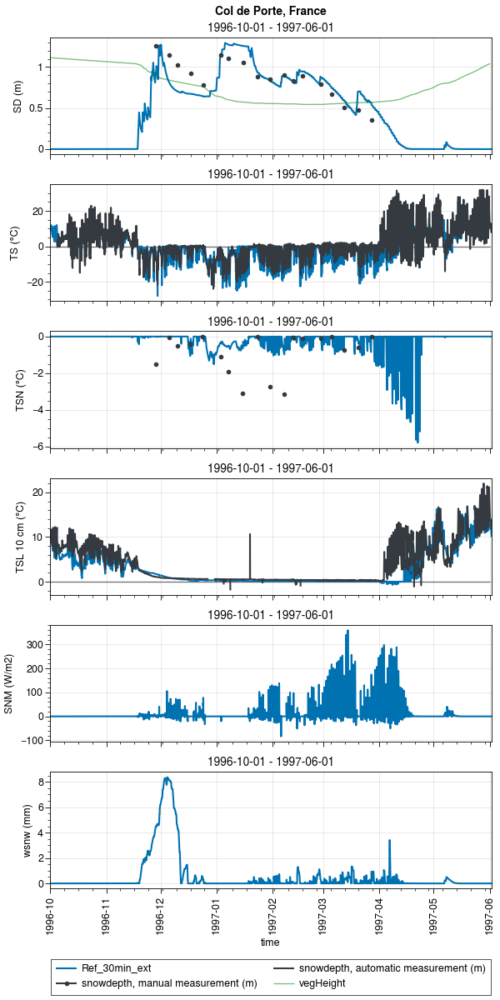

In [92]:
%matplotlib widget
color_obs = 'gray8'
period=slice('1996-10-01', '1997-06-01')

# fig, axs = pplt.subplots(nrows=4, ncols=1, refaspect=3.5, sharey=0, figsize=(6,8))
fig, axs = pplt.subplots(nrows=6, ncols=1, refaspect=3.5, sharey=0, figsize=(6,12))

##################
### Snow Depth ###
##################

# Simus
for ds_hh, label in zip(ds_hh_list[0:1], labels[0:1]):
    axs[0].plot(ds_hh.snd.sel(time=period), label=label)

# Obs
axs[0].plot(ds_h_eval_menard2019.snd_auto.sel(time=period), color=color_obs)
axs[0].plot(ds_h_eval_menard2019.snd_man.sel(time=period), marker='.', color=color_obs)

# Veg
axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)

fig.legend(loc='b', ncols=2)
axs[0].format(title=period.start+' - '+period.stop, ylabel='SD (m)')


##################
### TS ###
##################
# Simus
for ds_hh, label in zip(ds_hh_list[0:1], labels[0:1]):
    axs[1].plot(ds_hh.ts.sel(time=period)-273.15, label=label)

# Obs
axs[1].plot(ds_h_eval_menard2019.ts.sel(time=period), color=color_obs)
axs[1].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)

# axs[3].legend(loc='ul', ncols=2)
axs[1].format(title=period.start+' - '+period.stop, ylabel='TS (°C)')

##################
### T soil ###
##################

# Simus
for ds_hh, label in zip(ds_hh_list[0:1], labels[0:1]):
    axs[3].plot(ds_hh.tsl.sel(time=period).interp(layer=ds_h_eval_menard2019.sdepth.values).sel(layer=0.1)-273.15, label=label)
    
# Obs
axs[3].plot(ds_h_eval_menard2019.tsl.sel(time=period, sdepth=0.1), color=color_obs)

axs[3].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
# axs[0].legend(loc='ul', ncols=2)
axs[3].format(title=period.start+' - '+period.stop, ylabel='TSL 10 cm (°C)')


##################
### Snow temp ###
##################
# Simus
for ds_hh, label in zip(ds_hh_list[0:1], labels[0:1]):
    axs[2].plot(ds_hh.tsn.sel(time=period), label=label)

# Obs
# axs[2].plot(ds_tsn_loc.tsn.sel(time=period), label='Obs', marker='.', color=color_obs)
axs[2].plot(ds_tsn.tsn.sel(time=period), label='Obs', marker='.', color=color_obs)
axs[2].format(title=period.start+' - '+period.stop, ylabel='TSN (°C)')


# Simus
for ds_hh, label in zip(ds_hh_list[0:1], labels[0:1]):
    axs[4].plot(ds_hh.snm.sel(time=period), label=label)
axs[4].format(title=period.start+' - '+period.stop, ylabel='SNM (W/m2)')

# Simus
for ds_hh, label in zip(ds_hh_list[0:1], labels[0:1]):
    axs[5].plot(ds_hh.wsnw.sel(time=period), label=label)
axs[5].format(title=period.start+' - '+period.stop, ylabel='wsnw (mm)')


fig.suptitle(site_longname)

In [183]:
ds_hh_list[0]

<xarray.Dataset> Size: 125MB
Dimensions:     (time: 122736, layer: 20)
Coordinates:
  * time        (time) datetime64[ns] 982kB 1994-01-01 ... 2000-12-31T23:30:00
  * layer       (layer) float64 160B 0.05 0.15 0.25 0.35 ... 8.9 18.9 41.4 58.9
Data variables: (12/52)
    longitude   float64 8B 5.77
    latitude    float64 8B 45.3
    albs        (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    cdh         (time) float64 982kB 0.000277 0.0003388 ... 8.856e-07 6.224e-07
    cdm         (time) float64 982kB 0.0001389 0.0001757 ... 3.193e-07 2.232e-07
    evspsblsoi  (time) float64 982kB -1.157e-07 -5.26e-08 ... 7.55e-08 8.231e-08
    ...          ...
    tsgs        (time) float64 982kB 272.2 272.2 272.2 ... 249.9 249.9 249.9
    tsl         (time, layer) float64 20MB 273.2 274.0 274.2 ... 278.9 278.9
    tsn         (time) float64 982kB -1.227 -1.191 -1.156 ... -1.733 -1.746
    uvas        (time) float64 982kB 0.7 0.6 0.5 0.5 0.5 ... 1.0 1.05 1.1 0.95
    wsnw        (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    zpond       (time) float64 982kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        CLASSIC output file
    timestamp:    20240424 1059
    Conventions:  COARDS
    node_offset:  1
    Comment:       run_Ref_30min_ext


Loading metadata... 

[<DOM Element: caaml:timePosition at 0x1474b75d0b80>]
[<DOM Element: caaml:name at 0x1474b75d2320>, <DOM Element: caaml:name at 0x1474b75d24d0>]
no data in this field
no data in this field
no data in this field
[<DOM Element: caaml:position at 0x1474b75d28c0>]
no data in this field
no data in this field
no data in this field
Total snowpit depth = 105.0
layer # 0
{'dtop': 105.0, 'dtop_unit': 'cm', 'dbot': 104.0, 'thickness': 1.0, 'thickness_unit': 'cm', 'grain_type1': 'SH', 'grain_type2': None, 'grain_type3': None, 'grainSize_unit': None, 'grainSize_mean': 5.0, 'grainSize_max': None, 'hardness_ram': None, 'hardness_index': None, 'hardness': None, 'lwc': 'D', 'id': None, 'grain_size_unit': 'mm'}
layer # 1
{'dtop': 104.0, 'dtop_unit': 'cm', 'dbot': 98.0, 'thickness': 6.0, 'thickness_unit': 'cm', 'grain_type1': 'FC', 'grain_type2': None, 'grain_type3': None, 'grainSize_unit': None, 'grainSize_mean': 0.4, 'grainSize_max': None, 'hardness_ram': 19.3, 'hardness_index': 

/home/lalandmi/github/snowpyt/snowpyt/pit_class.py:499: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels_ax, rotation=45)
/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/matplotlib/cm.py:344: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


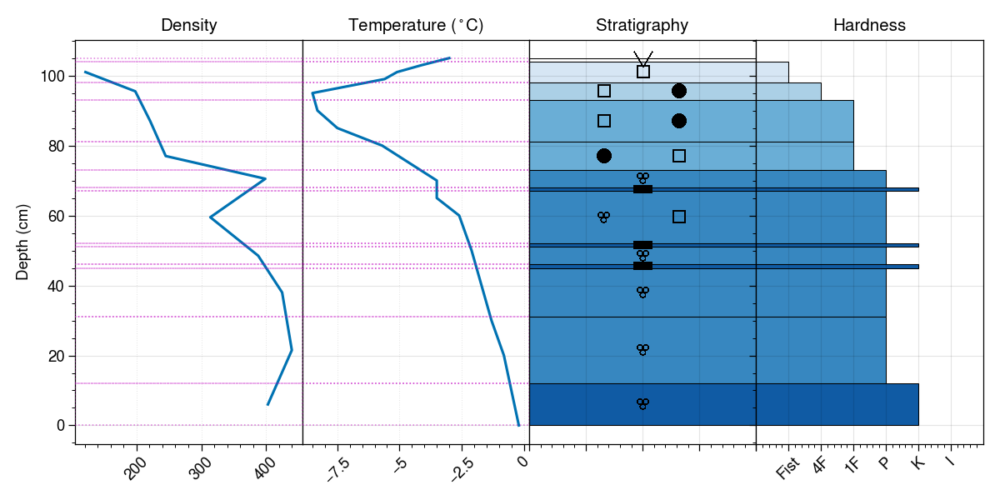

In [73]:
# date = '199701031100' # UTC
# date = '199701301000' # UTC
date = '199701151000' # UTC
# date = '199702071000' # UTC
# date = '199702171400' # UTC
path_lejeune2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/CRYOBSCLIM_CDP'

p = pc.Snowpit()
p.caaml_file = path_lejeune2019+'/CRYOBSCLIM.CDP.2018.SnowProfile/SnowProfile/colDePorte_'+date+'.caaml'
p.import_caamlv6()
p.plot(plot_order=['density', 'temperature', 'stratigraphy', 'hardness'])

Theoric snow temperature within CLASSIC: https://cccma.gitlab.io/classic/snowHeatCond_8f90.html#details

In [74]:
ds_hh = ds_hh_list[0]

In [75]:
ds_h_eval_menard2019.sel(time=date).ts

<xarray.DataArray 'ts' ()> Size: 4B
array(-10.5, dtype=float32)
Coordinates:
    time     datetime64[ns] 8B 1997-01-15T10:00:00
Attributes:
    long_name:  surface temperature
    units:      C

In [50]:
c

array([-0.48940234])

In [80]:
# date='1995-01-17T12:00:00'
# date = '199701031200' # UTC
# date = '199701301000' # UTC
date = '199701151100' # UTC
# date = '199702071000' # UTC
# date = '199702171400' # UTC
def T(z, a, b, c):
    return 1/2*a*z**2 + b*z + c

z = np.linspace(0, ds_hh.sel(time=date).snd.squeeze()*100)
c = (ds_hh.sel(time=date).ts-273.15).values
# c = -7.5
b = ((-3/(ds_hh.sel(time=date).snd*100))*(c-ds_hh.sel(time=date).tsn.values)).values
a = (-b/(ds_hh.sel(time=date).snd*100)).values
tsn_theoric = T(z, a, b, c)

tsn_obs = np.trapz(p.temperature_profile.temp, x=-p.temperature_profile.depth)/p.temperature_profile.depth[0]
tsn_th = np.trapz(tsn_theoric, x=z)/z[-1]
print('Snow temperature from obs: {:.2f}'.format(tsn_obs)+' °C')
print('Theoric snow temperature (model): {:.2f}'.format(tsn_th.item(0))+' °C')
print('Snow temperature from model: {:.2f}'.format(ds_hh.sel(time=date).tsn.values.item(0))+' °C')

Snow temperature from obs: -3.11 °C
Theoric snow temperature (model): -0.63 °C
Snow temperature from model: -0.63 °C


In [78]:
# # date='1995-01-17T12:00:00'
# # date = '199701031200' # UTC
# # date = '199701301000' # UTC
# date = '199701151100' # UTC
# # date = '199702071000' # UTC
# # date = '199702171400' # UTC
# def T(z, a, b, c):
#     return 1/2*a*z**2 + b*z + c

# z = np.linspace(0, 105)
# c = -3
# # c = -7.5
# b = (-3/105)*(c+3.11)
# a = -b/105
# tsn_theoric = T(z, a, b, c)

# tsn_obs = np.trapz(p.temperature_profile.temp, x=-p.temperature_profile.depth)/p.temperature_profile.depth[0]
# tsn_th = np.trapz(tsn_theoric, x=z)/z[-1]
# print('Snow temperature from obs: {:.2f}'.format(tsn_obs)+' °C')
# print('Theoric snow temperature (model): {:.2f}'.format(tsn_th.item(0))+' °C')
# print('Snow temperature from model: {:.2f}'.format(ds_hh.sel(time=date).tsn.values.item(0))+' °C')

Snow temperature from obs: -3.11 °C
Theoric snow temperature (model): -3.11 °C
Snow temperature from model: -0.63 °C


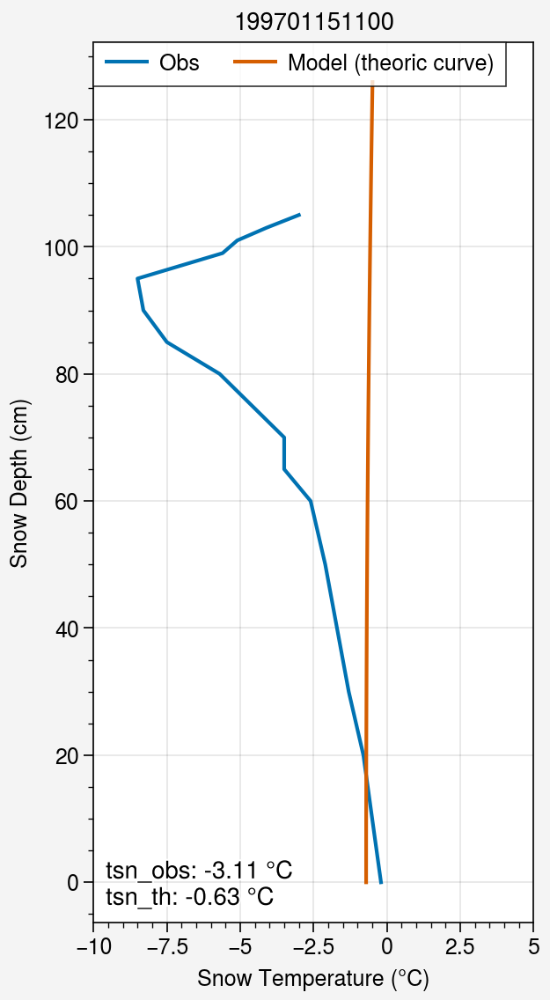

In [81]:
%matplotlib inline
fig, axs = pplt.subplots(refaspect=0.5)

axs[0].plot(p.temperature_profile.temp, p.temperature_profile.depth, label='Obs')
axs[0].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
axs[0].legend(loc='ul')

axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
             lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C',
             xlim=(-10, 5))

# fig.save('temp_profile_'+date+'.jpg')

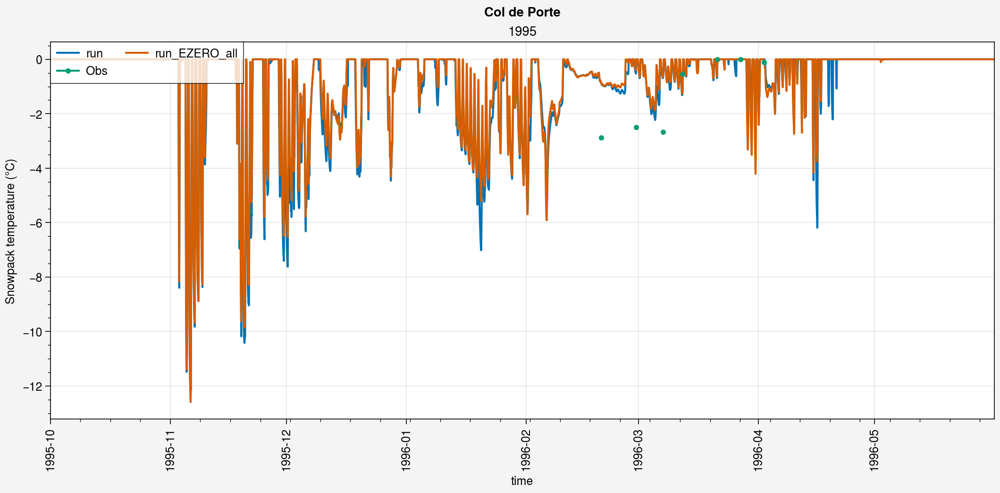

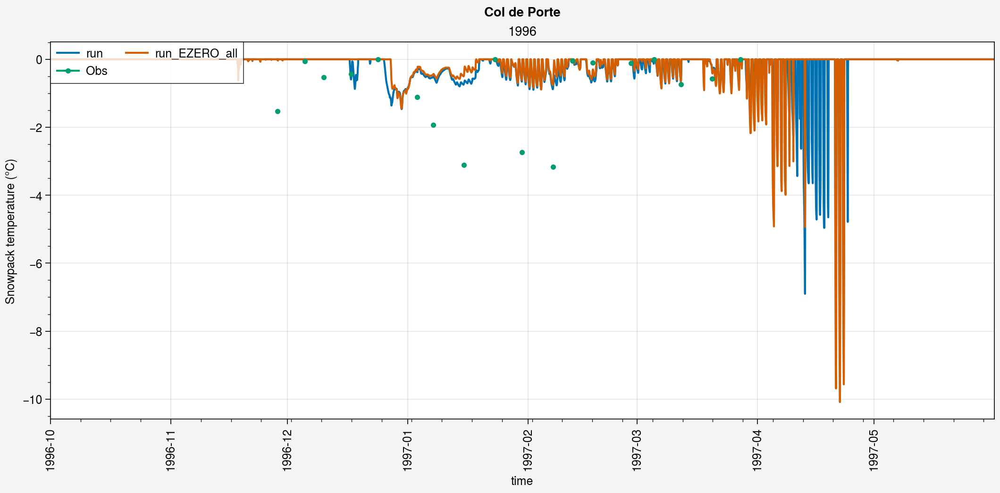

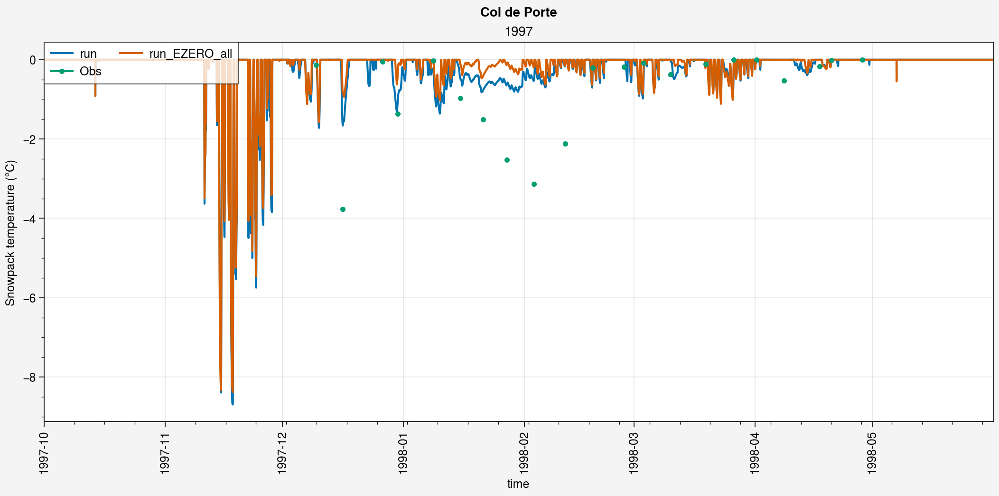

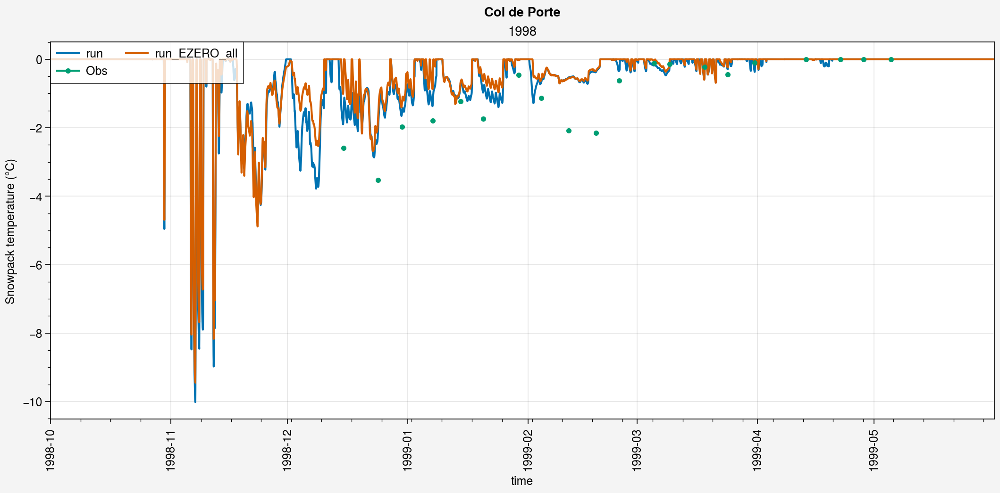

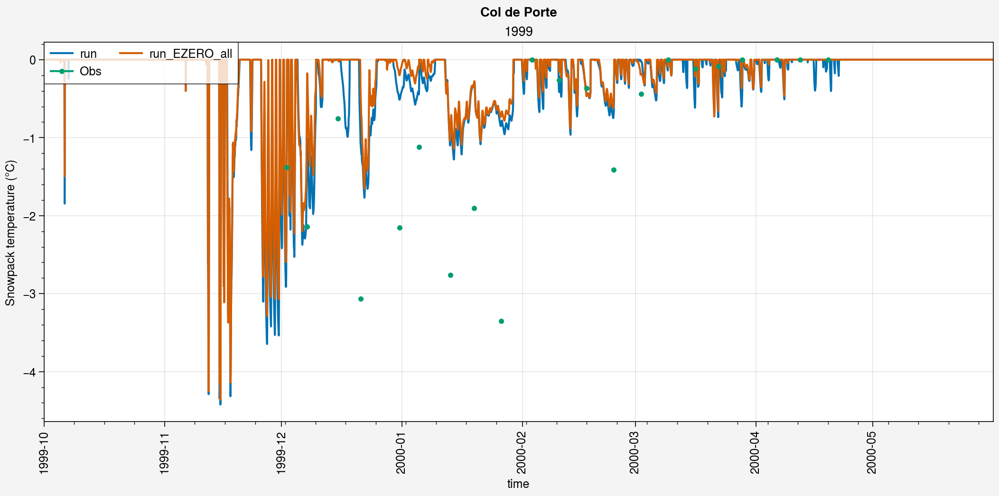

...

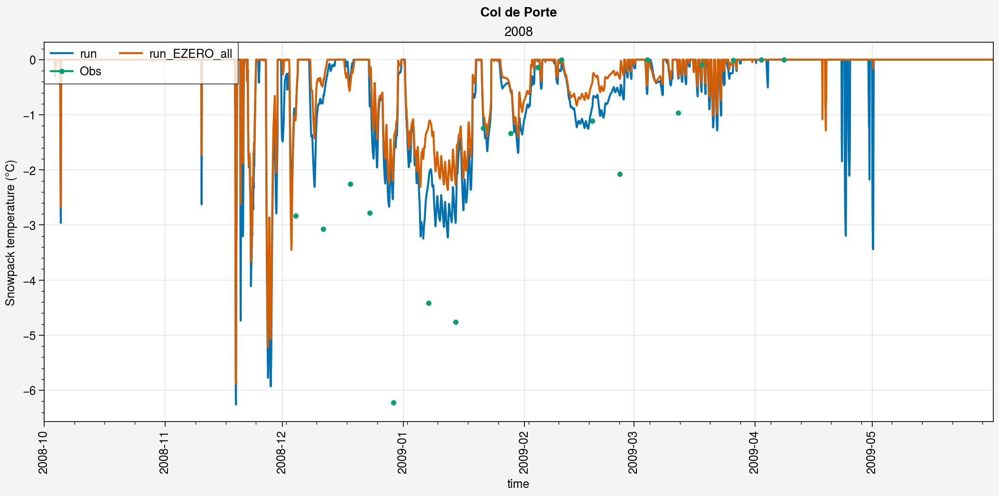

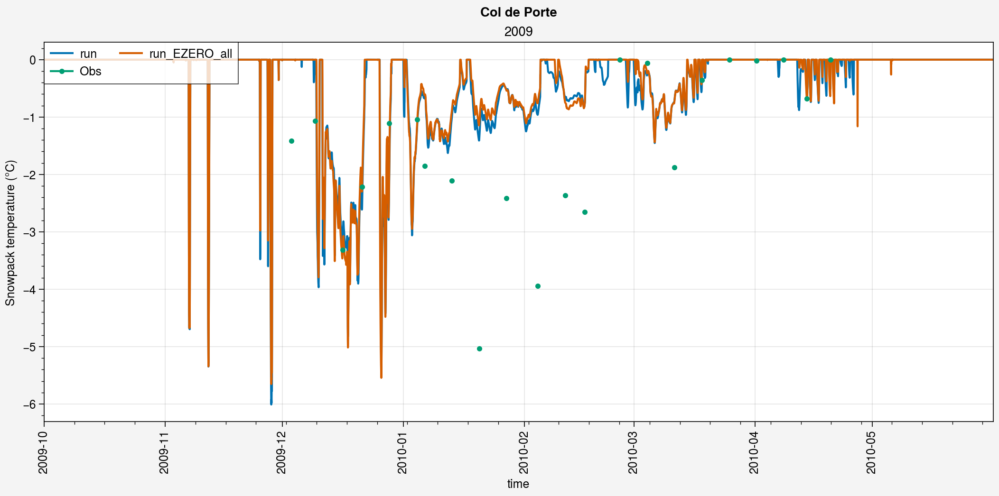

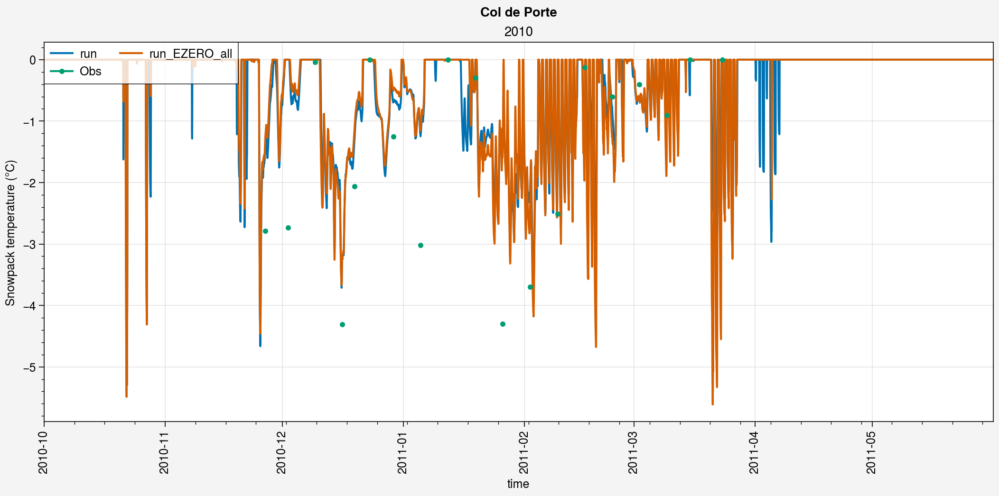

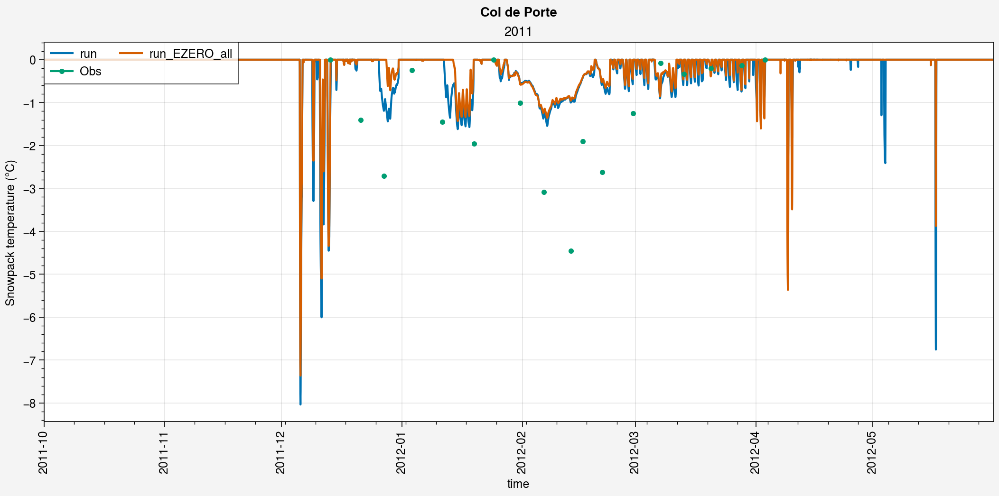

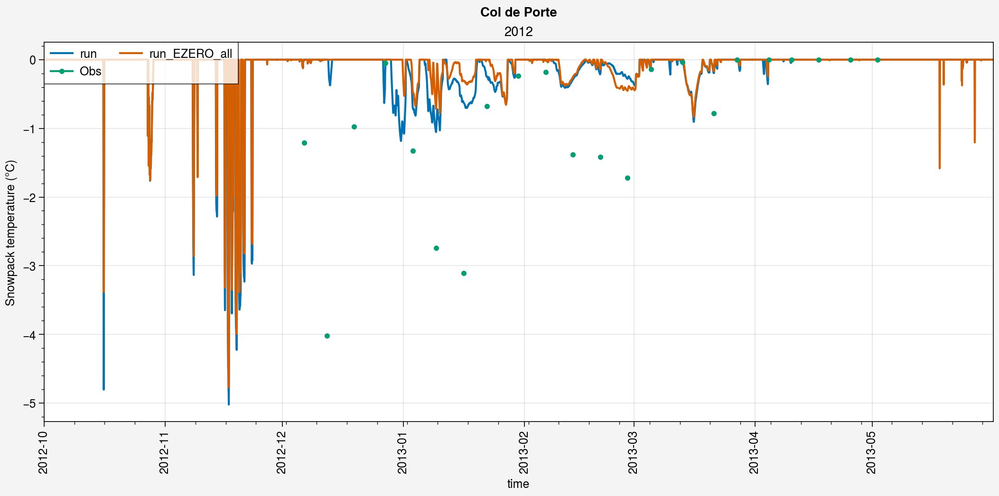

In [494]:
%matplotlib inline
# for year in pplt.arange(1995, 1995):
for year in pplt.arange(1995, 2012):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=2.5, refwidth=10)
    
    period=slice(str(year)+'-10',str(year+1)+'-05')
    
    # Simus
    axs[0].plot(ds_hh.tsn.sel(time=period).squeeze(), label=label)
    axs[0].plot(ds2_hh.tsn.sel(time=period).squeeze(), label=label2)

    # Obs
    axs[0].plot(ds_tsn.tsn.sel(time=period), label='Obs', marker='.')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=str(year), ylabel='Snowpack temperature (°C)')
    
    fig.suptitle('Col de Porte')
